In [628]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from scipy.stats import chisquare, chi2_contingency
from statsmodels.stats.outliers_influence import variance_inflation_factor

import collections
import plotly.express as px

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from imblearn.over_sampling import SMOTE 
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, classification_report, log_loss, roc_auc_score, roc_curve, auc, confusion_matrix, accuracy_score, balanced_accuracy_score, f1_score, recall_score, precision_score
from xgboost import XGBClassifier, XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler, RobustScaler, PolynomialFeatures, KBinsDiscretizer, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import RandomOverSampler

import pickle
import joblib

pd.set_option('display.max_columns', None)

<!-- <a id='intro'></a>
## Introduction
> This project will examine the dataset of The Movie Database (TMDB) which contains information about 10,000 movies. This dataset is sourced from kaggle which contains about the movie information and its revenue as well as user ratings. In this project, the investigation will cover the trends of movies information that impact the user ratings, revenue and gross profit.

> Pay attention to these columns:
- Certain columns, like ‘cast’ and ‘genres’, contain multiple values separated by pipe (|) characters.
- There are some odd characters in the ‘cast’ column. Don’t worry about cleaning them. You can leave them as is.
- The final two columns ending with “_adj” show the budget and revenue of the associated movie in terms of 2010 dollars, accounting for inflation over time.

## Questions
1. Revenue Adjusted
    - What is trends of revenue adjusted of film industry per year and per month?
    - What are Films that gain the highest and the lowest revenue adjusted?
    - What are genres that gain the highest and the lowest revenue adjusted? 
    - Who are the casts and What are their Film's revenue adjusted that gain the highest?
    - Who are the directors and What are their Film's revenue adjusted that gain the highest?
2. Gross Profit
    - What is trends of gross profit adjusted of film industry per year and per month?
    - What are Films that gain the highest and the lowest gross profit adjusted?
    - What are genres that gain the highest and the lowest gross profit adjusted? 
    - Who are the casts and What are their Film's gross profit adjusted that gain the highest?
    - Who are the directors and What are their Film's gross profit adjusted that gain the highest?
3. Popularity and Vote Count 
    - What are movies that gain the most popularity?
    - What are genres that gain the most popularity?
    - What are movies that gain the most vote count?
    - What are genres that gain the most vote count?
4. What variables that have the high correlation with Gross Profit?

<!-- > **Tip**: In this section of the report, provide a brief introduction to the dataset you've selected for analysis. At the end of this section, describe the questions that you plan on exploring over the course of the report. Try to build your report around the analysis of at least one dependent variable and three independent variables. If you're not sure what questions to ask, then make sure you familiarize yourself with the dataset, its variables and the dataset context for ideas of what to explore. -->

<!-- > If you haven't yet selected and downloaded your data, make sure you do that first before coming back here. In order to work with the data in this workspace, you also need to upload it to the workspace. To do so, click on the jupyter icon in the upper left to be taken back to the workspace directory. There should be an 'Upload' button in the upper right that will let you add your data file(s) to the workspace. You can then click on the .ipynb file name to come back here. -->



## Variables Description

|Variables|Description|
|:--|:--|
|job_level| Level Jabatan Pekerja|
|job_duration_in_current_job_level | Masa Kerja pada job level saat ini|
|person_level | Level personal Pekerja|
|job_duration_in_current_person_level | Masa Kerja pada person level saat ini|
|job_duration_in_current_branch | Masa Kerja pada unit kerja saat ini|
|Employee_type | Tipe Pekerja ( 3 tipe Relationship Manager, tipe A, B , dan C)|
|gender | Jenis Kelamin|
|age | Usia|
|marital_status_maried(Y/N) | Status Pernikahan (Y / N)|
|number_of_dependences | Jumlah anak dalam tanggungan|
|Education_level | Tingkat pendidikan|
|GPA | IPK|
|year_graduated | Tahun lulus|
|job_duration_from_training | lama bekerja mulai dari training|
|branch_rotation | Jumlah rotasi pindah unit kerja|
|job_rotation | jumlah rotasi pindah jabatan|
|assign_of_otherposition | jumlah rotasi penugasan|
|annual leave | jumlah cuti tahunan|
|sick_leaves | jumlah izin sakit|
|Last_achievement_% | presentase pencapaian triwulan terakhir terhadap target|
|Achievement_above_100%\_during3quartal | Jumlah pencapaian diatas 100% dalam 3 tahun terkahir|
|Best Performance | Termasuk dalam best performance (1/0)|

<a id='wrangling'></a>
## Data Wrangling

First thing first, let's look at the dataset for preceeding investigation.

<!-- > **Tip**: In this section of the report, you will load in the data, check for cleanliness, and then trim and clean your dataset for analysis. Make sure that you document your steps carefully and justify your cleaning decisions. -->

### General Properties

In [2]:
# Load train.csv dataset
df = pd.read_csv('train.csv')

# Display the first 5 rows
df.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,Y,1,level_0,2.86,2011,4,2,3,2,3,0,46.37,0.0,0
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,Y,0,level_1,7.28,2007,4,4,3,0,0,1,47.68,0.0,0
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,Y,1,level_1,0.00,1989,28,10,9,6,2,1,40.73,0.0,0
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,Y,2,level_1,0.00,1987,29,11,6,0,4,10,47.42,0.0,1
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,Y,3,level_1,7.20,1985,30,9,8,2,3,0,47.18,0.0,0


In [3]:
# Show columns of the dataset
df.columns

Index(['job_level', 'job_duration_in_current_job_level', 'person_level',
       'job_duration_in_current_person_level',
       'job_duration_in_current_branch', 'Employee_type', 'gender', 'age',
       'marital_status_maried(Y/N)', 'number_of_dependences',
       'Education_level', 'GPA', 'year_graduated',
       'job_duration_from_training', 'branch_rotation', 'job_rotation',
       'assign_of_otherposition', 'annual leave', 'sick_leaves',
       'Last_achievement_%', 'Achievement_above_100%_during3quartal',
       'Best Performance'],
      dtype='object')

In [4]:
# Show the total of rows x columns of the dataset
df.shape

(11153, 22)

In [5]:
# Show the info of columns, null values and data types of variables
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11153 entries, 0 to 11152
Data columns (total 22 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   job_level                              11153 non-null  object 
 1   job_duration_in_current_job_level      11153 non-null  float64
 2   person_level                           11153 non-null  object 
 3   job_duration_in_current_person_level   11153 non-null  float64
 4   job_duration_in_current_branch         11153 non-null  float64
 5   Employee_type                          11153 non-null  object 
 6   gender                                 11153 non-null  int64  
 7   age                                    11153 non-null  int64  
 8   marital_status_maried(Y/N)             11153 non-null  object 
 9   number_of_dependences                  11153 non-null  int64  
 10  Education_level                        11153 non-null  object 
 11  GP

## Statistical Properties

In [6]:
# Statistical Description of each numerical variables
df.describe()

,job_duration_in_current_job_level,job_duration_in_current_person_level,job_duration_in_current_branch,gender,age,number_of_dependences,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
count,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11153.000000,11152.000000,11152.000000,11153.000000
mean,1.433208,1.349218,1.034646,1.735587,1985.837084,0.995517,3.176195,2009.174124,6.277952,3.720165,3.505694,1.202726,3.664216,1.100152,72.234902,0.679071,0.146777
std,0.431086,0.324660,0.416723,0.441040,4.632214,0.881103,13.321687,4.117162,5.033553,2.399068,1.818028,2.575138,2.652648,2.714525,23.030421,1.107381,0.353899
min,0.000000,0.000000,0.000000,1.000000,1963.000000,0.000000,0.000000,1982.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,4.510000,0.000000,0.000000
25%,1.224745,1.224745,0.707107,1.000000,1985.000000,0.000000,2.820000,2008.000000,4.000000,2.000000,2.000000,0.000000,2.000000,0.000000,56.650000,0.000000,0.000000
50%,1.352775,1.352775,1.118034,2.000000,1987.000000,1.000000,3.070000,2010.000000,5.000000,3.000000,3.000000,0.000000,3.000000,0.000000,71.675000,0.000000,0.000000
75%,1.414214,1.385641,1.224745,2.000000,1989.000000,2.000000,3.270000,2012.000000,6.000000,4.000000,4.000000,1.000000,5.000000,1.000000,88.172500,1.000000,0.000000
max,2.958040,2.828427,2.677686,2.000000,1997.000000,7.000000,378.000000,2019.000000,36.000000,22.000000,15.000000,29.000000,21.000000,77.000000,130.000000,3.000000,1.000000


In [7]:
# Show the median of each numerical variables
df.median()

job_duration_in_current_job_level           1.352775
job_duration_in_current_person_level        1.352775
job_duration_in_current_branch              1.118034
gender                                      2.000000
age                                      1987.000000
number_of_dependences                       1.000000
GPA                                         3.070000
year_graduated                           2010.000000
job_duration_from_training                  5.000000
branch_rotation                             3.000000
job_rotation                                3.000000
assign_of_otherposition                     0.000000
annual leave                                3.000000
sick_leaves                                 0.000000
Last_achievement_%                         71.675000
Achievement_above_100%_during3quartal       0.000000
Best Performance                            0.000000
dtype: float64

In [8]:
# Show the mean of each numerical variables
df.mean()

job_duration_in_current_job_level           1.433208
job_duration_in_current_person_level        1.349218
job_duration_in_current_branch              1.034646
gender                                      1.735587
age                                      1985.837084
number_of_dependences                       0.995517
GPA                                         3.176195
year_graduated                           2009.174124
job_duration_from_training                  6.277952
branch_rotation                             3.720165
job_rotation                                3.505694
assign_of_otherposition                     1.202726
annual leave                                3.664216
sick_leaves                                 1.100152
Last_achievement_%                         72.234902
Achievement_above_100%_during3quartal       0.679071
Best Performance                            0.146777
dtype: float64

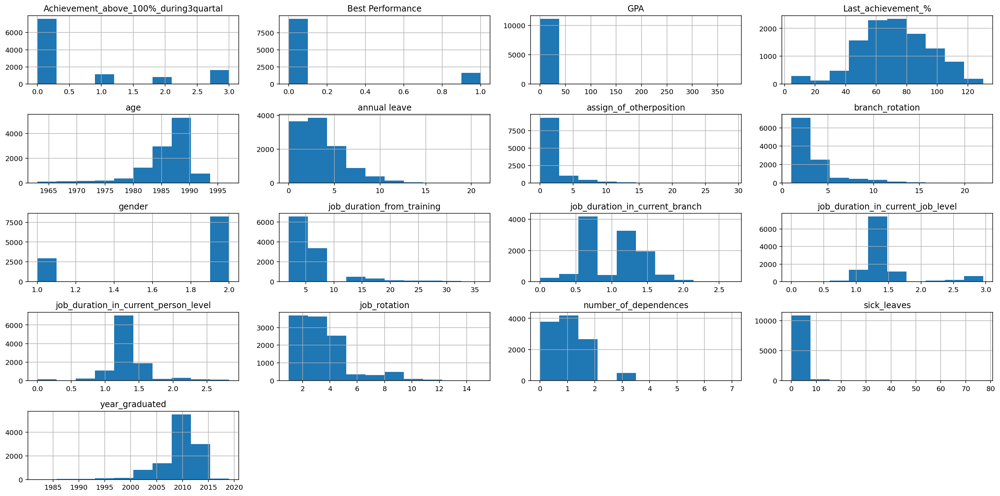

In [9]:
# Histogram of Quantitative Variables
df.hist(figsize=(20,10));
plt.tight_layout();

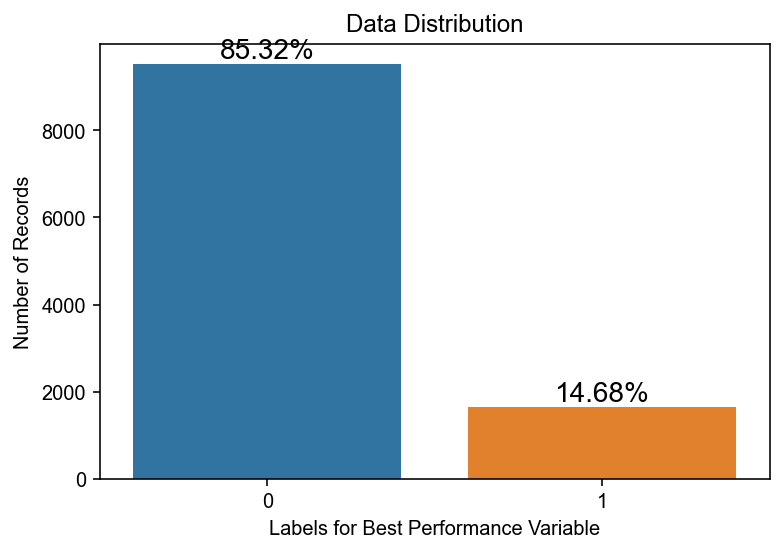

In [11]:
# Data Visualization of Total Labels Percentage
sns.countplot(df['Best Performance']).set_title('Data Distribution')
ax = plt.gca()
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width()/2, height + 2, '{:.2f}%'.format(100*(height/len(df))), fontsize=14, ha='center', va='bottom')
sns.set(font_scale=1.1)
ax.set_xlabel("Labels for Best Performance Variable");
ax.set_ylabel("Number of Records");

There are many records with the target label 0 and fewer records with the target label 1. You can see that the data records with a 0 label are about 85.32%, whereas 14.68% of the data records are labeled 1.

## Finding Missing Values

In [12]:
# Investigate Missing Values
df.isnull().sum()

job_level                                0
job_duration_in_current_job_level        0
person_level                             0
job_duration_in_current_person_level     0
job_duration_in_current_branch           0
Employee_type                            0
gender                                   0
age                                      0
marital_status_maried(Y/N)               0
number_of_dependences                    0
Education_level                          0
GPA                                      0
year_graduated                           0
job_duration_from_training               0
branch_rotation                          0
job_rotation                             0
assign_of_otherposition                  0
annual leave                             0
sick_leaves                              0
Last_achievement_%                       1
Achievement_above_100%_during3quartal    1
Best Performance                         0
dtype: int64

In [13]:
# Investigate Null value in Last_achievement_% Variables
df[df['Last_achievement_%'].isnull()]

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
1882,JG04,1.292285,PG03,1.292285,0.911043,RM_type_A,1,1991,N,0,level_3,2.88,2012,5,4,5,0,1,15,NaN,NaN,0


In [14]:
# Investigate Null value in Achievement_above_100%_during3quartal Variables
df[df['Achievement_above_100%_during3quartal'].isnull()]

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
1882,JG04,1.292285,PG03,1.292285,0.911043,RM_type_A,1,1991,N,0,level_3,2.88,2012,5,4,5,0,1,15,NaN,NaN,0


In [15]:
# Replace null values with Mean
df_data_mean_replace = df.fillna((df.mean()))
df_data_mean_replace.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,Y,1,level_0,2.86,2011,4,2,3,2,3,0,46.37,0.0,0
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,Y,0,level_1,7.28,2007,4,4,3,0,0,1,47.68,0.0,0
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,Y,1,level_1,0.00,1989,28,10,9,6,2,1,40.73,0.0,0
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,Y,2,level_1,0.00,1987,29,11,6,0,4,10,47.42,0.0,1
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,Y,3,level_1,7.20,1985,30,9,8,2,3,0,47.18,0.0,0


In [17]:
# Replace Null Values with Median
df_data_median_replace = df.fillna((df.median()))
df_data_median_replace.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,Y,1,level_0,2.86,2011,4,2,3,2,3,0,46.37,0.0,0
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,Y,0,level_1,7.28,2007,4,4,3,0,0,1,47.68,0.0,0
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,Y,1,level_1,0.00,1989,28,10,9,6,2,1,40.73,0.0,0
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,Y,2,level_1,0.00,1987,29,11,6,0,4,10,47.42,0.0,1
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,Y,3,level_1,7.20,1985,30,9,8,2,3,0,47.18,0.0,0


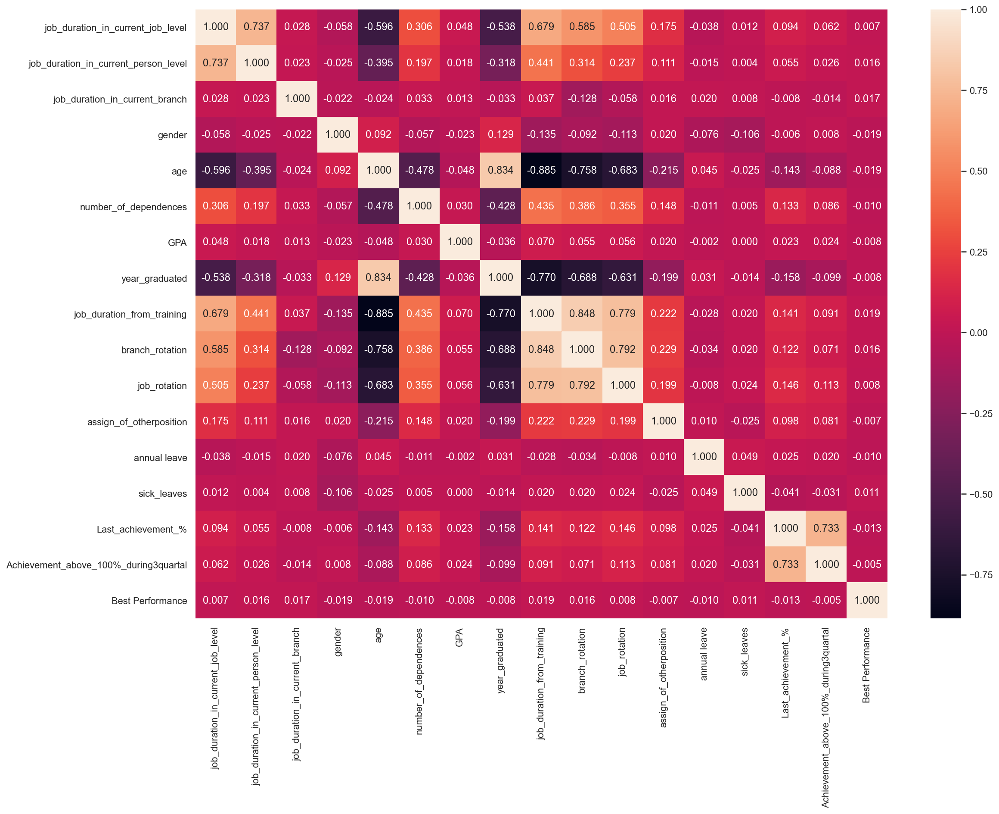

In [19]:
sns.set()
plt.figure(figsize=(18, 13))
sns.heatmap(df_data_mean_replace.corr(), annot=True, fmt=".3f");

Considering the logical and high correlation to Best Performance, we choose these variables to predict the Best Performance:
1. job_duration_in_current_person_level
2. job_duration_in_current_branch
3. gender
4. number_of_dependences
5. age
6. job_duration_from_training
7. branch_rotation
8. annual leave
9. sick_leaves
10. Last_achievement_%

In [21]:
# Impute Median Values to Null Values
df = df_data_median_replace 

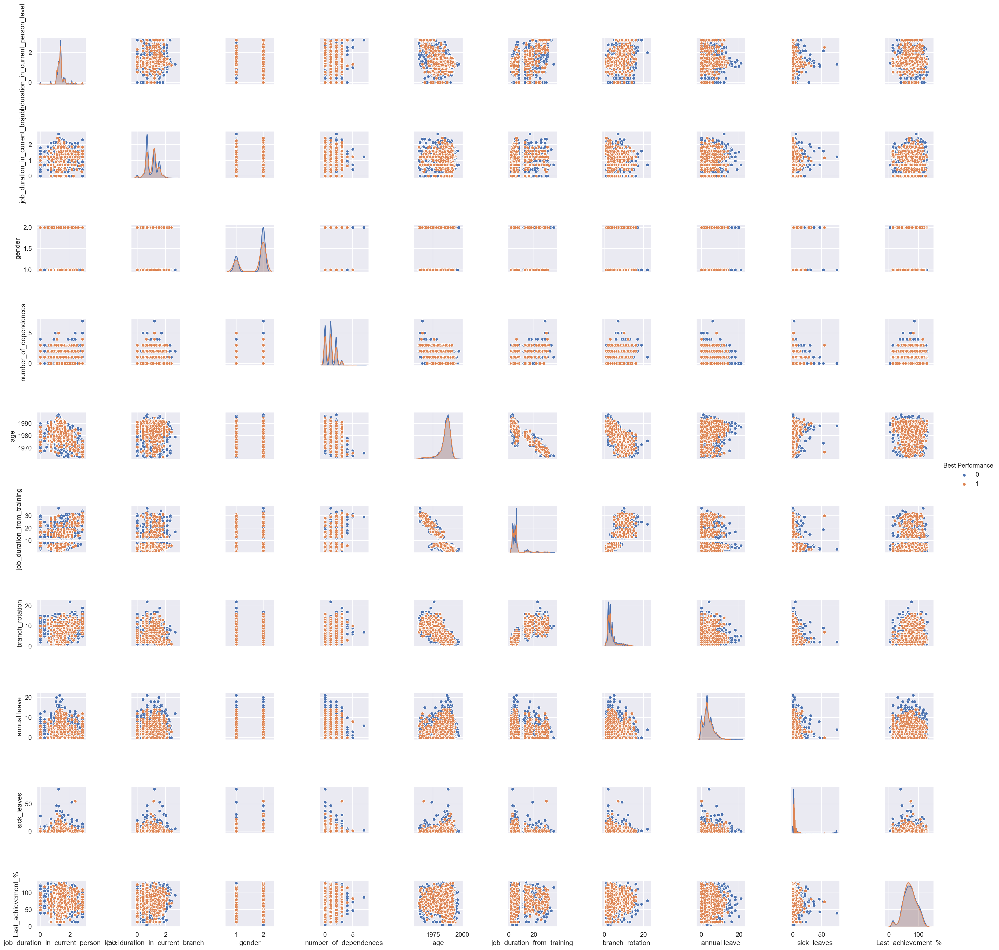

In [29]:
sns.pairplot(df[['job_duration_in_current_person_level', 'job_duration_in_current_branch', 
                'gender', 'number_of_dependences', 'age', 'job_duration_from_training', 
                'branch_rotation', 'annual leave', 'sick_leaves', 'Last_achievement_%', 'Best Performance']], hue='Best Performance');

## Detecting Outliers

In [222]:
def countplot(col):
    sns.countplot(df[col]).set_title(f'{col}')
    ax = plt.gca()
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2, height + 2, '{:.2f}%'.format(100*(height/len(df))), fontsize=14, ha='center', va='bottom')
    sns.set(font_scale=1.1)
    ax.set_xlabel(f"Labels for {col} Variable");
    ax.set_ylabel("Number of Records");
    
# def countplot_best_performance(col):
#     x = df.groupby(['job_level', 'Best Performance'])['job_level'].count().unstack().reset_index()
# #     x = pd.DataFrame(df.groupby(col)['Best Performance'].count()/len(df) * 100).reset_index()
# #     ax = sns.barplot(x[col], x['Best Performance'])
#     g = sns.catplot(x="col", y="total_bill",
#                 hue="smoker", col="time",
#                 data=df, kind="bar",
#                 height=4, aspect=.7);
#     for p in ax.patches:
#         height = p.get_height()
#         ax.text(p.get_x() + p.get_width()/2, height + 2, '{:.2f}%'.format(height), fontsize=14, ha='center', va='bottom')
#     sns.set(font_scale=1.1)
#     ax.set_title(f'Total Percentage of Best Performance per {col} Variable', pad=20)

def countplot_best_performance(col):
    x = df.groupby([col, 'Best Performance'])[col].count().unstack(level=0)/len(df) * 100
    x.index.name = None
    axes = plt.gca()
    axes.bar([idx+1 for idx, val in enumerate(x.columns)], x.iloc[:1, :].values[0])
    axes.bar([idx+1 for idx, val in enumerate(x.columns)], x.iloc[1:2, :].values[0], bottom = x.iloc[:1, :].values[0])
    t = 0
    temp_name = []
    for p in ax.patches:
        name = np.sum(x.iloc[:, t:1+t].values)
        temp_name.append(name)
        axes.text(p.get_x() + p.get_width()/2, name, '{:.2f}%'.format(name), fontsize=14, ha='center', va='bottom')
        t += 1
    axes.set_ylim([0,100])
    plt.xticks([1, 2, 3], x.columns)
    plt.legend([0, 1], labels=['0', '1'], title='Best Performance')
    plt.title(f'Total Percentage of {col} per Best Performance', fontsize=14)
    plt.xlabel(f'{col}')
    plt.ylabel('Total Percentage', fontsize=16);

In [184]:
# Percentile based outlier detection
def percentile_based_outlier(data, th=95):
    diff = (100 - th)/2.0
    (minval, maxval) = np.percentile(data, [diff, 100 - diff])
    return ((data < minval) | (data > maxval))

# Median Absolute Deviation (MAD)
def mad_based_outlier(points, th=3.5):
    if len(points.shape) == 1:
        points = points[:, None]
    median_y = np.median(points)
    median_absolute_deviation_y = np.median([np.abs(y - median_y) for y in points])
    modified_z_scores = [0.6745 * (y - median_y)/median_absolute_deviation_y for y in points]
    return np.abs(modified_z_scores) > th

# def is_mad_based_outlier(points, compare_to, thresh=3.5):
#     if len(points.shape) == 1:
#         points = points[:,None]
    
#     median = np.median(points, axis=0)
#     diff = np.sum((points - median)**2, axis=-1)
#     med_abs_deviation = np.median(diff)

#     diff_p = math.sqrt((compare_to - median) ** 2)
#     z_score_p = 0.6745 * diff_p / med_abs_deviation

#     return z_score_p > thresh

# Standard Deviation
def std_div(data, th=1):
    std = data.std()
    mean = data.mean()
    isOutlier = []
    for val in data:
        if val/std > th:
            isOutlier.append(True)
        else:
            isOutlier.append(False)
    return isOutlier

# Majority Vote
def outlierVote(data):
    x = percentile_based_outlier(data)
    y = mad_based_outlier(data)
    z = std_div(data)
    temp = list(zip(data.index, x, y, z))
    final = []
    for i in range(len(temp)):
        if temp[i].count(False) >= 2:
            final.append(False)
        else:
            final.append(True)
    return final

def outlierRatio(data):
    functions = [percentile_based_outlier, mad_based_outlier, std_div, outlierVote]
    outlierDict = {}
    for func in functions:
        funcResult = func(data)
        count = 0
        for val in funcResult:
            if val == True:
                count += 1
        outlierDict[str(func)[10:].split()[0]] = [count, '{:.2f}%'.format((float(count)/len(data)) * 100)]
    return outlierDict 

### 1. Job Level

|Job Level|Jabatan|
|:--:|:--:|
|JG03|Petugas ADK|
|JG04|Mantri/RM Dana Ritel|
|JG05|RM Kredit (Kecil, Program, Briguna dan Konsumer)|

*RM: Relationship Manager

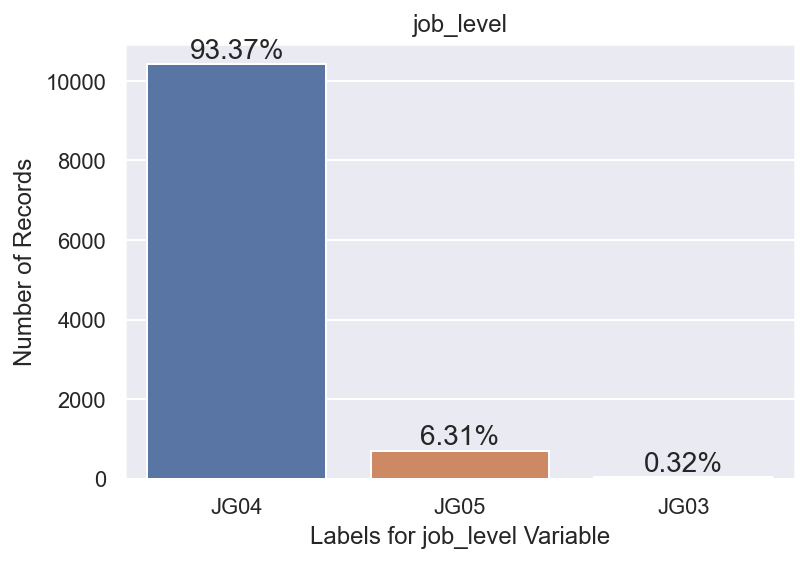

In [25]:
# Investigate the total percentage of Job Level
countplot('job_level')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



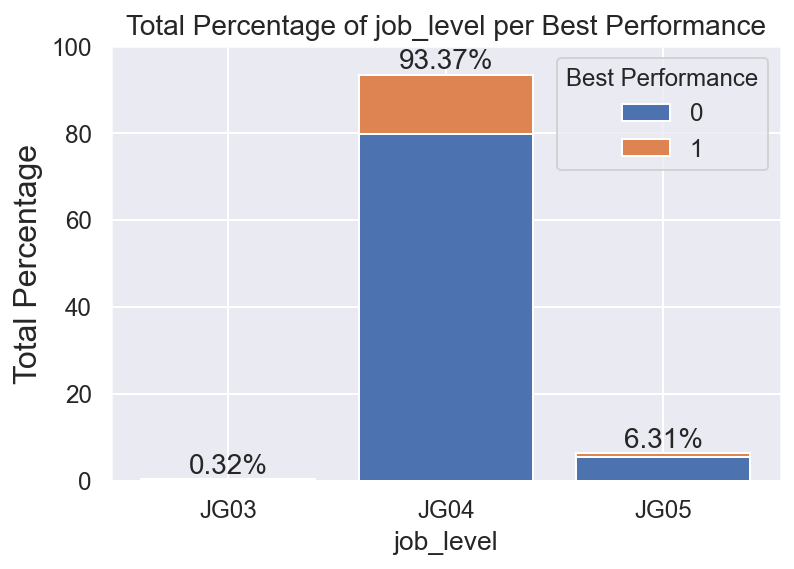

In [223]:
# Total Percentage of Best Performance per Job Level
countplot_best_performance('job_level')

### 2. Job Duration in Current Job Level

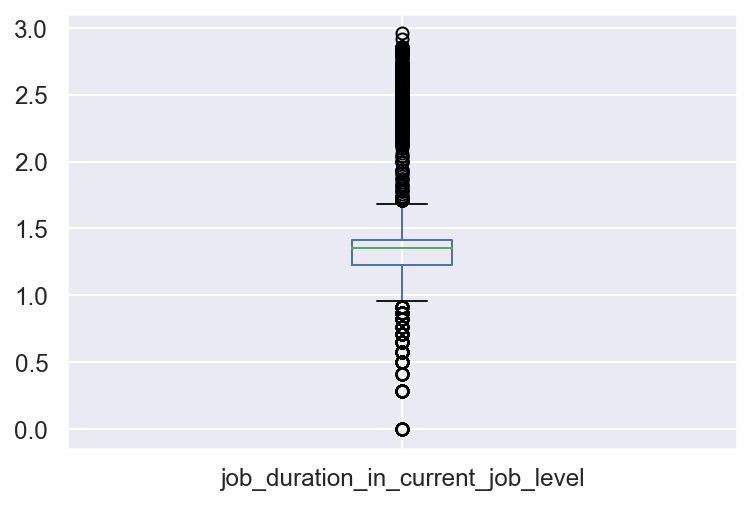

In [77]:
# Investigate outlier in job_duration_in_current_job_level variable
df['job_duration_in_current_job_level'].plot.box();

In [224]:
outlierRatio(df['job_duration_in_current_job_level'])

{'percentile_based_outlier': [299, '2.68%'],
 'mad_based_outlier': [1212, '10.87%'],
 'std_div': [11118, '99.69%'],
 'outlierVote': [1280, '11.48%']}

### 3. Person Level

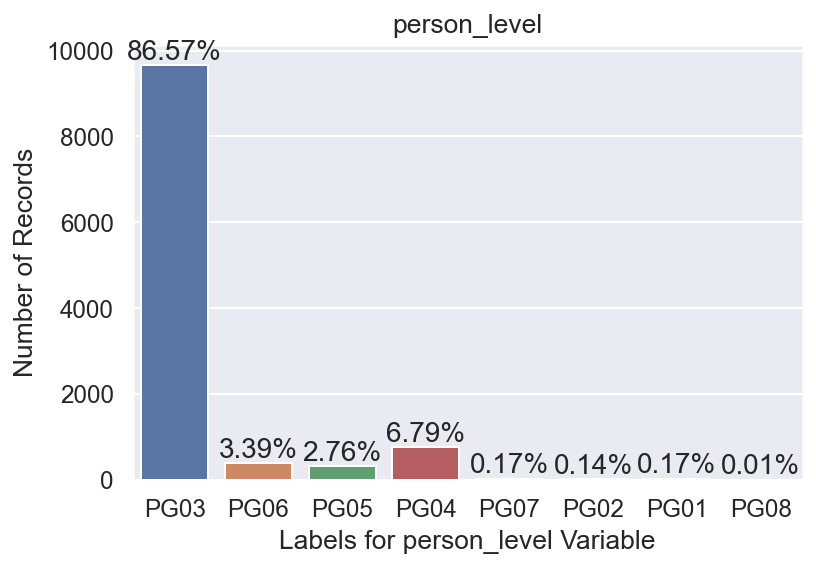

In [225]:
# Investigate the total percentage of Person Level
countplot('person_level')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



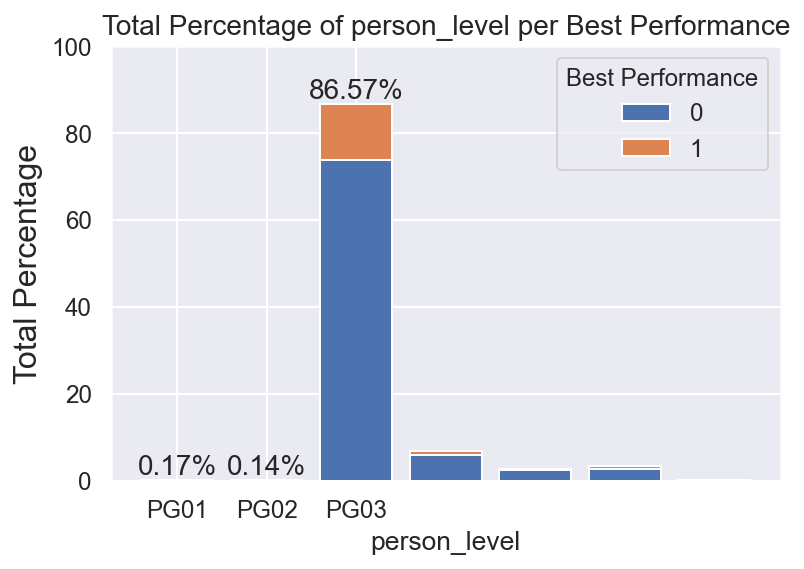

In [226]:
# Total Percentage of Best Performance per Job Level
countplot_best_performance('person_level')

### 4. Job Duration in Current Person Level

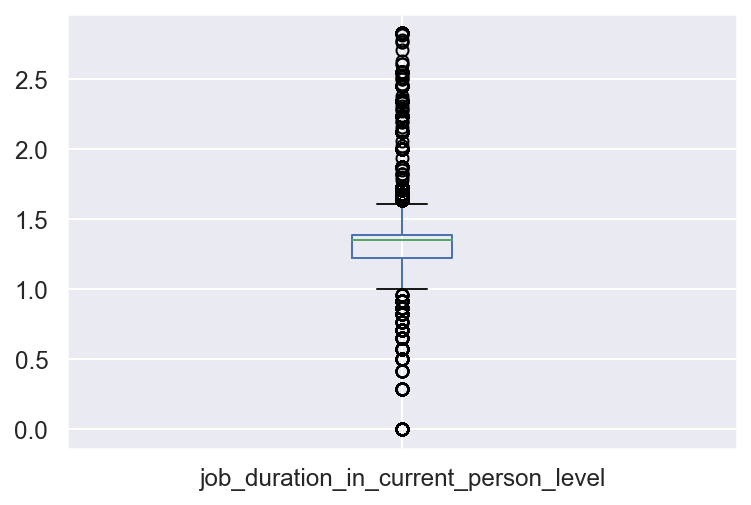

In [227]:
df['job_duration_in_current_person_level'].plot.box();

In [228]:
outlierRatio(df['job_duration_in_current_person_level'])

{'percentile_based_outlier': [452, '4.05%'],
 'mad_based_outlier': [1046, '9.38%'],
 'std_div': [11016, '98.77%'],
 'outlierVote': [1046, '9.38%']}

### 5. Job Duration in Current Branch

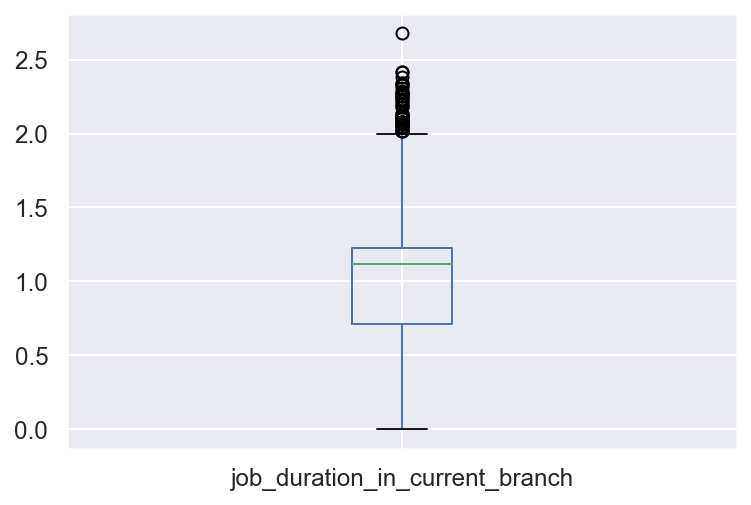

In [229]:
df['job_duration_in_current_branch'].plot.box();

In [230]:
outlierRatio(df['job_duration_in_current_branch'])

{'percentile_based_outlier': [506, '4.54%'],
 'mad_based_outlier': [0, '0.00%'],
 'std_div': [10607, '95.10%'],
 'outlierVote': [251, '2.25%']}

### 6. Employee Type

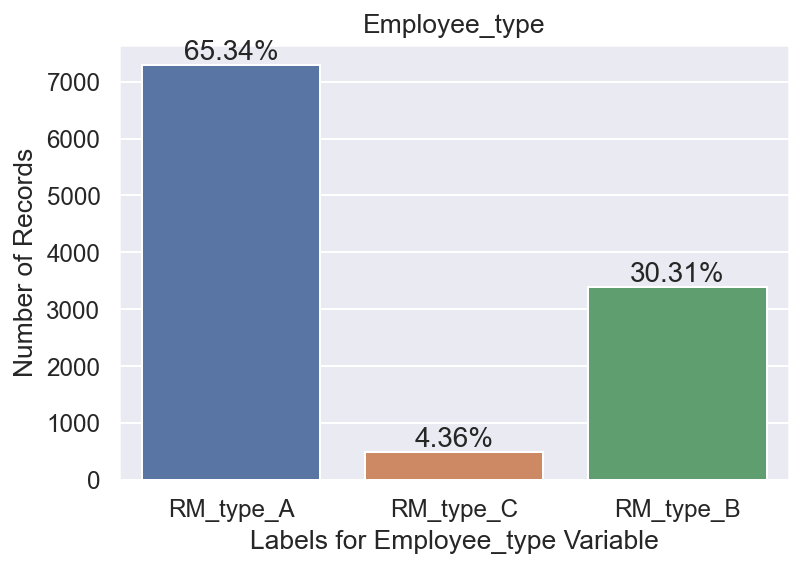

In [231]:
countplot('Employee_type')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



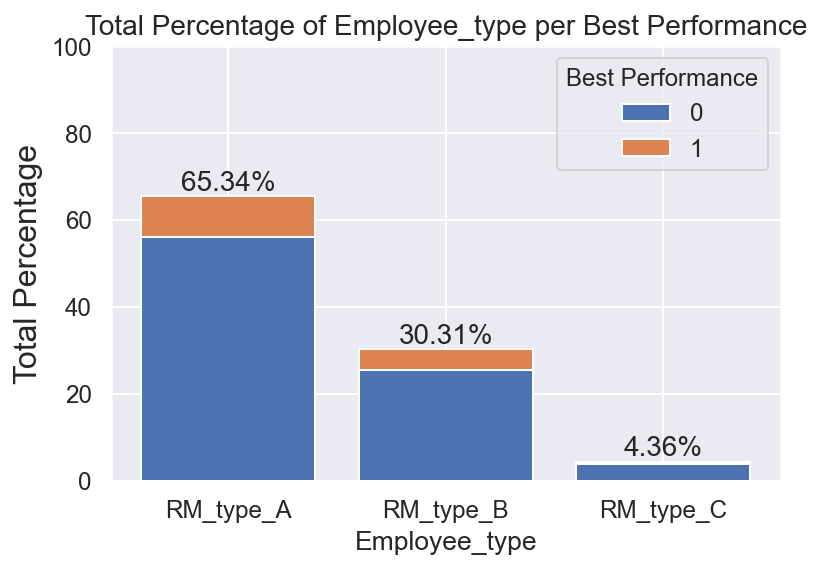

In [232]:
countplot_best_performance('Employee_type')

### 7. Gender

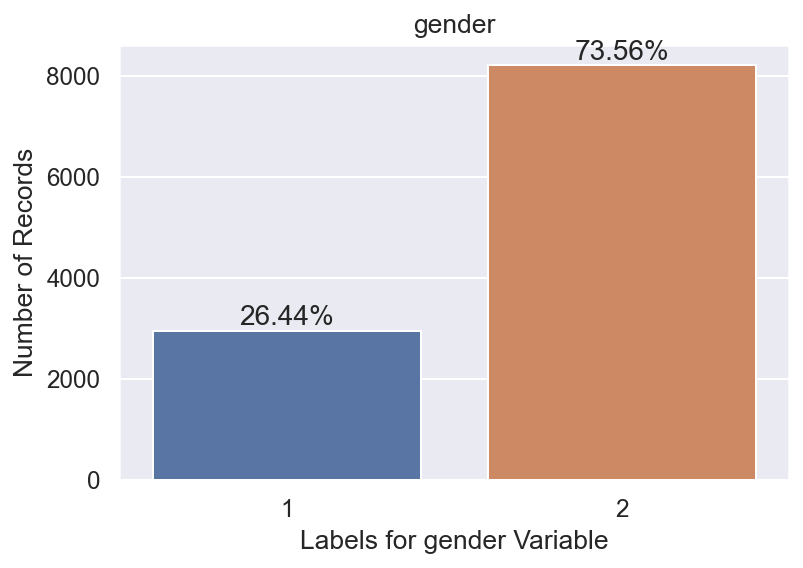

In [233]:
countplot('gender')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



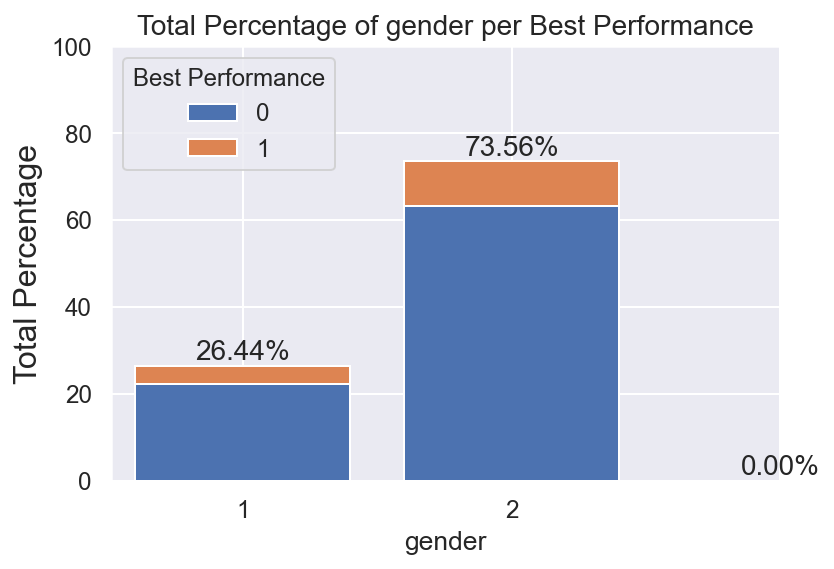

In [234]:
countplot_best_performance('gender')

### 8. Age

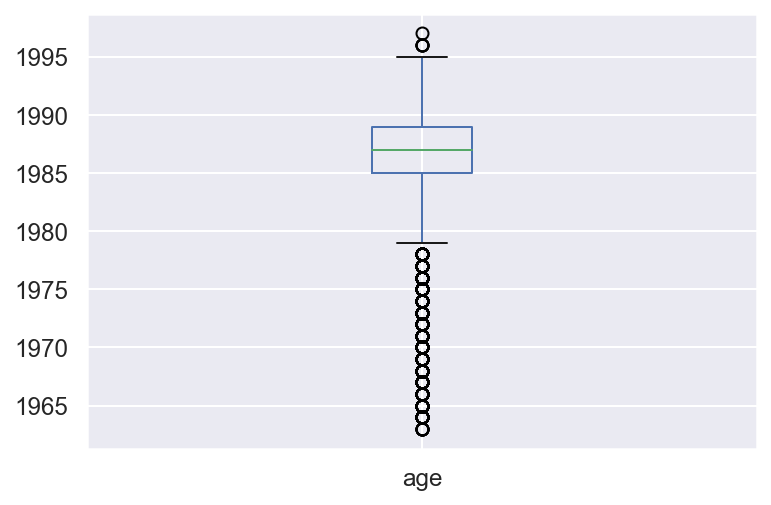

In [235]:
df['age'].plot.box();

In [236]:
outlierRatio(df['age'])

{'percentile_based_outlier': [520, '4.66%'],
 'mad_based_outlier': [538, '4.82%'],
 'std_div': [11153, '100.00%'],
 'outlierVote': [813, '7.29%']}

In [394]:
df['age_new'] = pd.qcut(df['age'], 3, labels=['Muda', 'Dewasa', 'Tua'])

### 9. Age After Subtracted by Year of 2020

In [237]:
df['age_from_2020'] = 2020 - df['age']

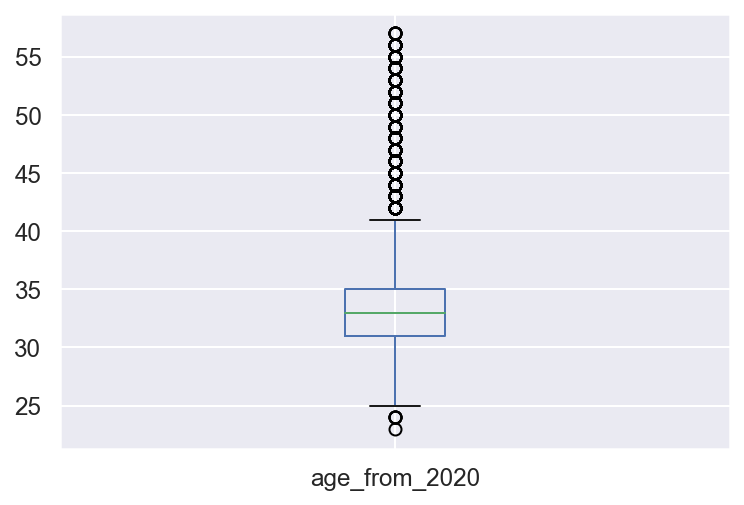

In [238]:
df['age_from_2020'].plot.box();

In [239]:
collections.Counter(df['age_from_2020'])

Counter({35: 954,
         31: 1323,
         50: 38,
         53: 35,
         55: 27,
         49: 38,
         51: 41,
         52: 44,
         29: 511,
         54: 25,
         27: 55,
         40: 228,
         46: 47,
         32: 1558,
         30: 926,
         26: 16,
         56: 29,
         24: 4,
         34: 1348,
         43: 92,
         44: 73,
         45: 55,
         25: 7,
         57: 6,
         28: 192,
         39: 240,
         33: 1473,
         47: 45,
         41: 154,
         42: 121,
         48: 35,
         36: 654,
         37: 472,
         38: 286,
         23: 1})

In [240]:
outlierRatio(df['age_from_2020'])

{'percentile_based_outlier': [520, '4.66%'],
 'mad_based_outlier': [538, '4.82%'],
 'std_div': [11153, '100.00%'],
 'outlierVote': [813, '7.29%']}

### 10. Marital Status (Y/N)

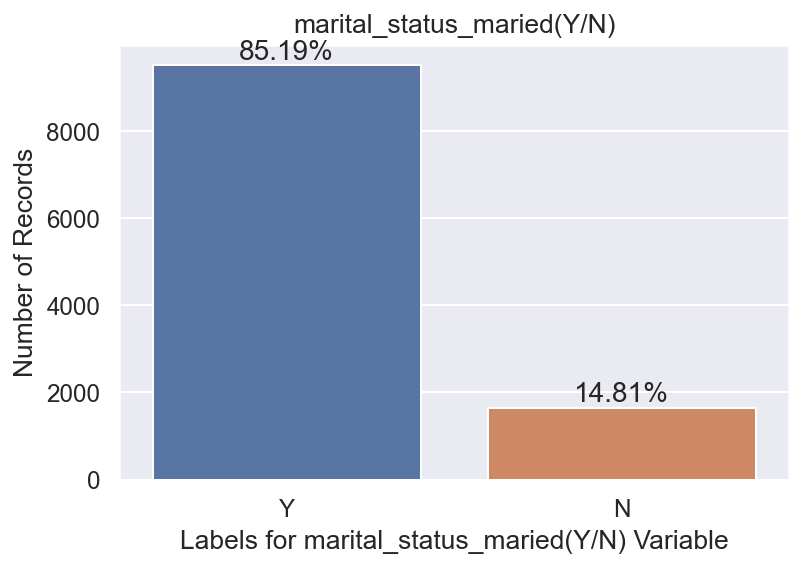

In [241]:
countplot('marital_status_maried(Y/N)')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



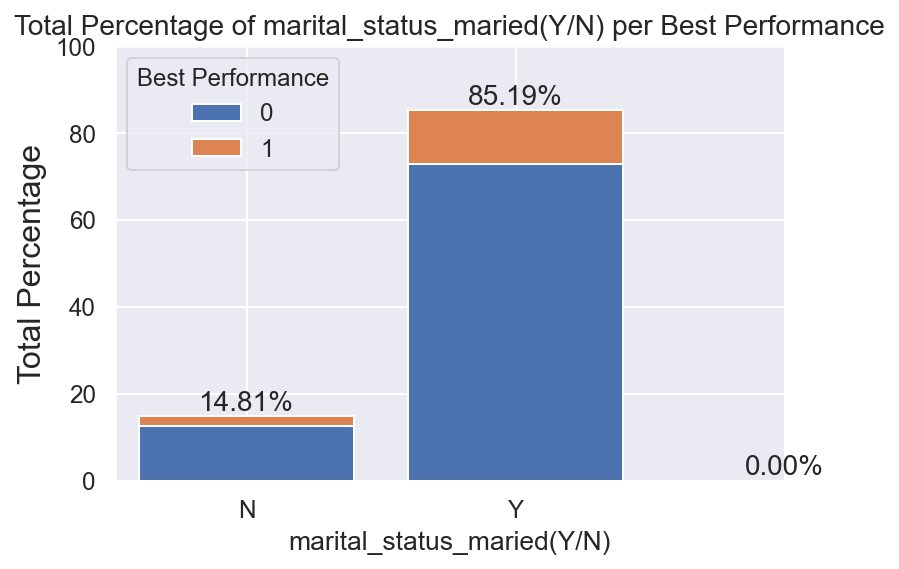

In [242]:
countplot_best_performance('marital_status_maried(Y/N)')

### 11. Number of Dependences

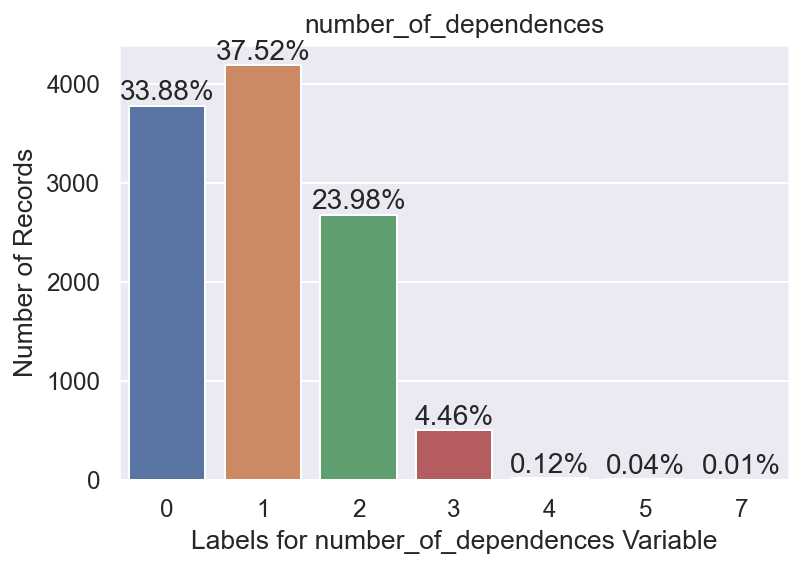

In [243]:
countplot('number_of_dependences')

In [244]:
collections.Counter(df['number_of_dependences'])

Counter({1: 4185, 0: 3779, 2: 2674, 3: 497, 4: 13, 5: 4, 7: 1})

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



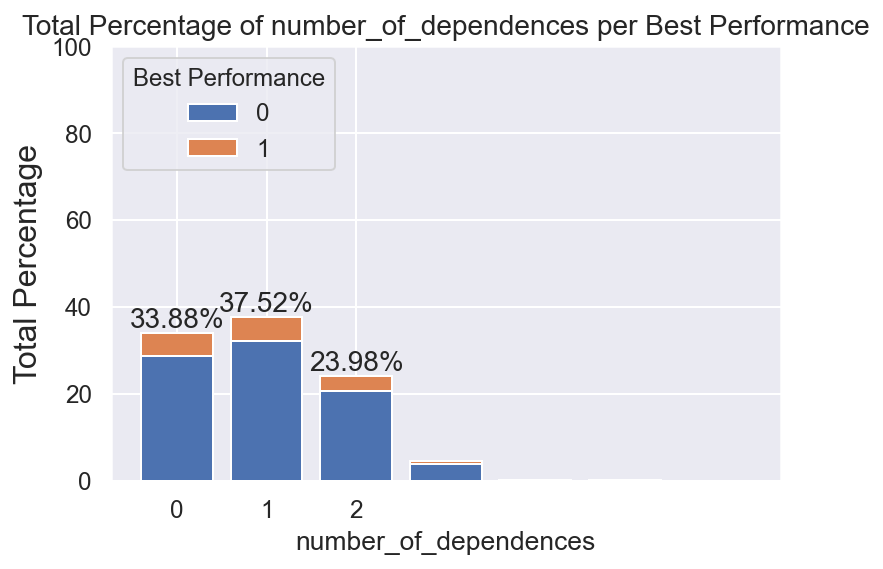

In [245]:
countplot_best_performance('number_of_dependences')

### 12. GPA

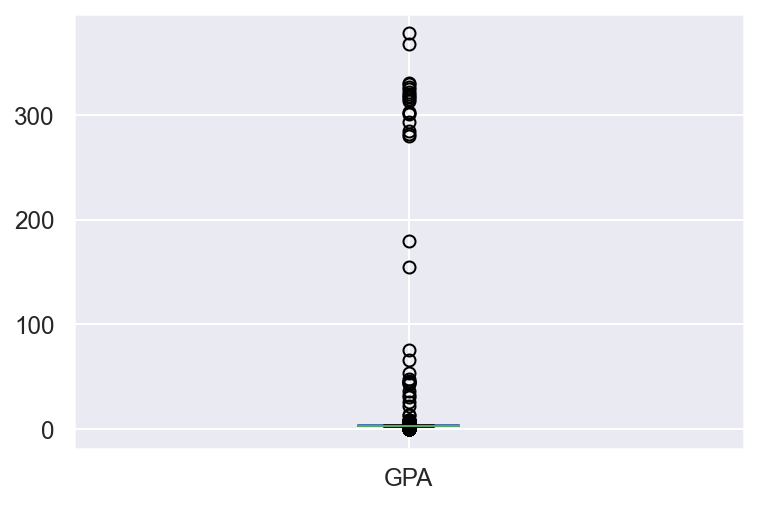

In [246]:
df['GPA'].plot.box();

In [247]:
outlierRatio(df['GPA'])

{'percentile_based_outlier': [276, '2.47%'],
 'mad_based_outlier': [2200, '19.73%'],
 'std_div': [38, '0.34%'],
 'outlierVote': [51, '0.46%']}

Jabatan JG03:
1. Pendidikan D1 s.d. D4 dari Universitas/Perguruan Tinggi Akreditasi "A" dengan IPK min. 2.75 (skala 4)
2. Usia maksimal 22 tahun (berulan tahun ke-23 pada saat seleksi awal)
3. Surat Keterangan Catatan Kepolisian (SKCK)
4. Bersedia ditempatkan di seluruh Unit Kerja BRI
5. Diutamakan berdomisili di Unit Kerja Setempat

Jabatan JG4 s.d. JG5:
1. Diutamakan Pendidikan S1 dari Universitas/Perguruan Tinggi Akreditasi "A" dengan IPK min. 2.75 (skala 4)
2. Lulusan D3 usia maksimal 22 tahun (berulan tahun ke-23 pada saat seleksi awal), lulusan S1 usia maksimal 25 tahun (belum berulang tahun ke-26 pada saat seleksi awal)
3. Surat Keterangan Catatan Kepolisian (SKCK)
4. Bersedia ditempatkan di seluruh Unit Kerja BRI
5. Diutamakan berdomisili di Unit Kerja Setempat

sumber: https://www.scribd.com/document/476514672/Rekrutmen

In [250]:
# According to the job requirement, the min required GPA is 2.75 and max 4
len(df[(df['GPA'] < 2.75) | (df['GPA'] > 4)])/len(df) * 100

21.30368510714606

There are 21% data which is not supposedly the right values of GPA requirement.

In [251]:
# Find the Maximum GPA in between range
df[(df['GPA'] <= 4) & (df['GPA'] >= 2.75)]['GPA'].max()

3.97

In [254]:
# Total Percentage of GPA that is above 4.00
len(df[(df['GPA'] >= 4)]['GPA'])/len(df) * 100

0.46624226665471175

The are 0.466% data of GPA which GPA is above 4.00.

In [255]:
# The GPA which is above 275 is assumed to be erroneous input
# Threfore, the value of GPA above 275 to GPA will be divided by 100
df.loc[df['GPA'] > 275, 'GPA'] = df['GPA']/100

In [256]:
# Total Percentage of GPA that is above 4.00
len(df[(df['GPA'] >= 4)]['GPA'])/len(df) * 100

0.002958845153770286

In [259]:
# Total row with GPA below 2.75
len(df[(df['GPA'] < 2.75)]['GPA'])/len(df) * 100

20.837442840491345

In [262]:
# According to the job requirement, the min required GPA is 2.75 and max 4
len(df[(df['GPA'] < 2.75) | (df['GPA'] >= 4)])/len(df) * 100

21.133327355868374

There are still 21.13% GPA which is not the right value.

In [263]:
temp = df[(df['GPA'] < 2.75) | (df['GPA'] >= 4)]
temp['Best Performance'].value_counts()

0    1989
1     368
Name: Best Performance, dtype: int64

In [265]:
len(df[~((df['GPA'] < 2.75) | (df['GPA'] >= 4))])/len(df)

0.7886667264413162

In [275]:
median_GPA = df[(df['GPA'] >= 2.75) | (df['GPA'] <= 4)]['GPA'].median()
median_GPA

3.07

In [274]:
# Change the value of GPA above to 4 to median_GPA
df.loc[df['GPA'] > 4.0, 'GPA'] = median_GPA

In [276]:
# Change the value of GPA below 2.75 and above 0.0 to GPA divided by 100
df.loc[(df['GPA'] < 2.75) & (df['GPA'] > 0), 'GPA'] = 2.75

In [277]:
# Change the value of GPA above 275 to GPA divided by 100
df.loc[df['GPA'] == 0, 'GPA'] = median_GPA

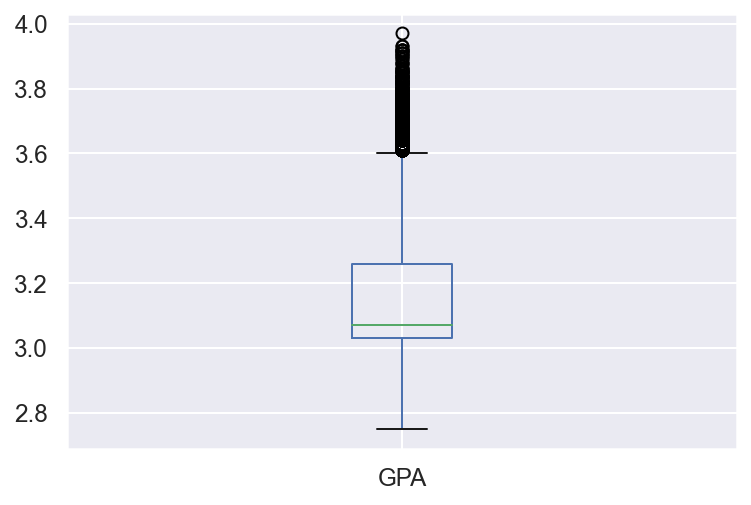

In [278]:
df['GPA'].plot.box();

In [279]:
outlierRatio(df['GPA'])

{'percentile_based_outlier': [518, '4.64%'],
 'mad_based_outlier': [308, '2.76%'],
 'std_div': [11153, '100.00%'],
 'outlierVote': [560, '5.02%']}

### 13. Year Graduated

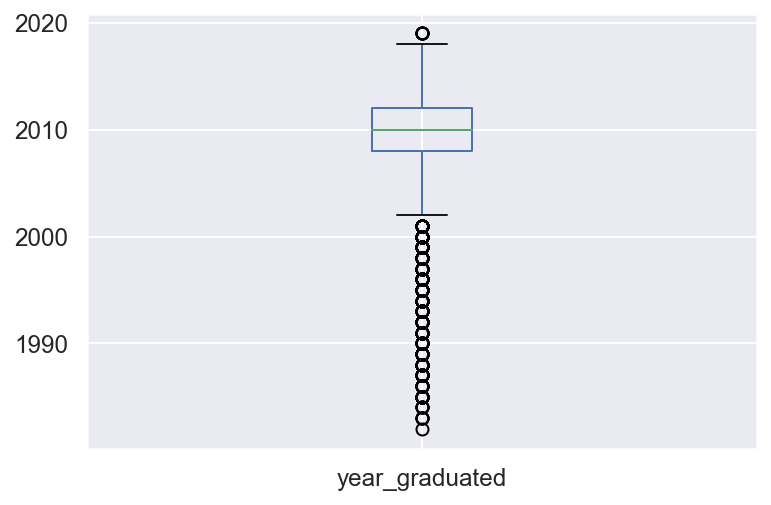

In [280]:
df['year_graduated'].plot.box();

In [281]:
outlierRatio(df['year_graduated'])

{'percentile_based_outlier': [510, '4.57%'],
 'mad_based_outlier': [301, '2.70%'],
 'std_div': [11153, '100.00%'],
 'outlierVote': [549, '4.92%']}

### 14. Year Graduated from 2020

In [282]:
df['year_graduated_from_2020'] = 2020 - df['year_graduated']

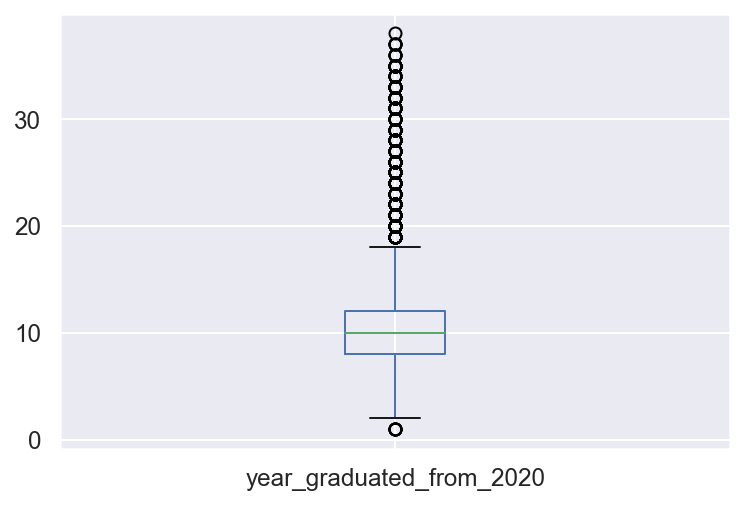

In [283]:
df['year_graduated_from_2020'].plot.box();

In [284]:
outlierRatio(df['year_graduated_from_2020'])

{'percentile_based_outlier': [510, '4.57%'],
 'mad_based_outlier': [301, '2.70%'],
 'std_div': [11068, '99.24%'],
 'outlierVote': [464, '4.16%']}

### 15. Job Duration from Training

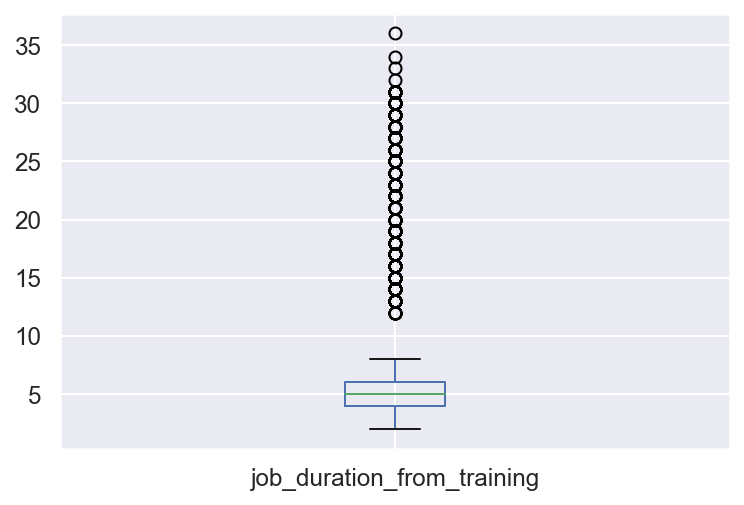

In [285]:
df['job_duration_from_training'].plot.box();

In [286]:
outlierRatio(df['job_duration_from_training'])

{'percentile_based_outlier': [267, '2.39%'],
 'mad_based_outlier': [1268, '11.37%'],
 'std_div': [4619, '41.41%'],
 'outlierVote': [1268, '11.37%']}

### 16. Branch Rotation

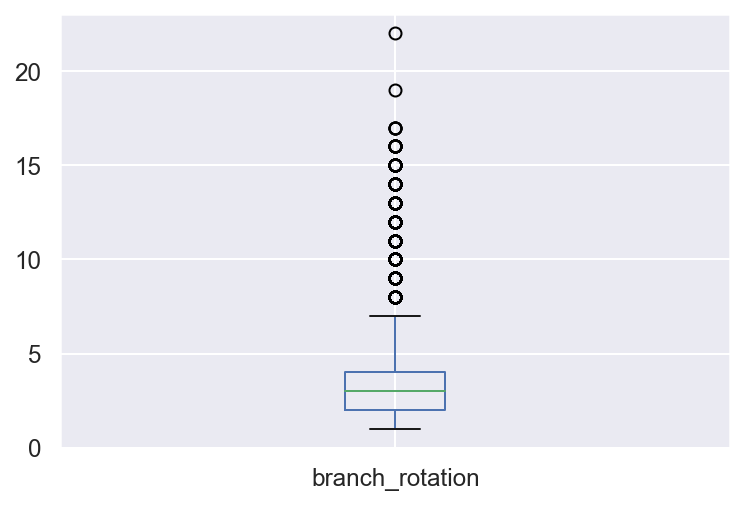

In [287]:
df['branch_rotation'].plot.box();

In [288]:
outlierRatio(df['branch_rotation'])

{'percentile_based_outlier': [208, '1.86%'],
 'mad_based_outlier': [767, '6.88%'],
 'std_div': [7465, '66.93%'],
 'outlierVote': [767, '6.88%']}

### 17. Job Rotation

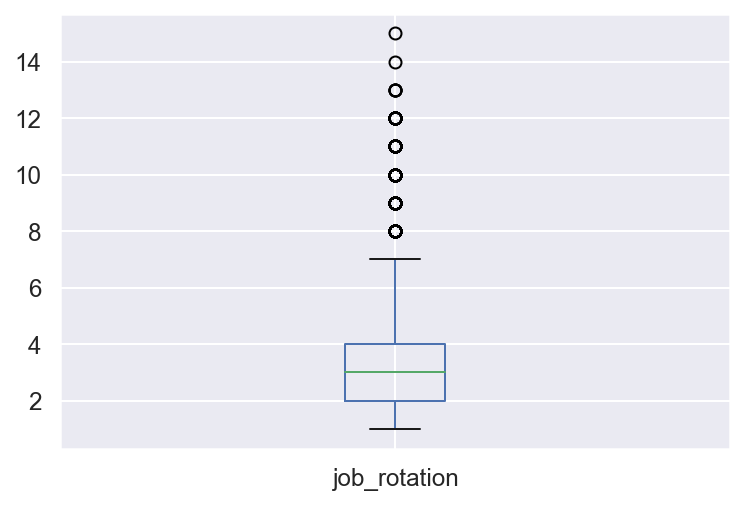

In [289]:
df['job_rotation'].plot.box();

In [290]:
outlierRatio(df['job_rotation'])

{'percentile_based_outlier': [166, '1.49%'],
 'mad_based_outlier': [346, '3.10%'],
 'std_div': [11132, '99.81%'],
 'outlierVote': [346, '3.10%']}

### 18. Assign of Other Position

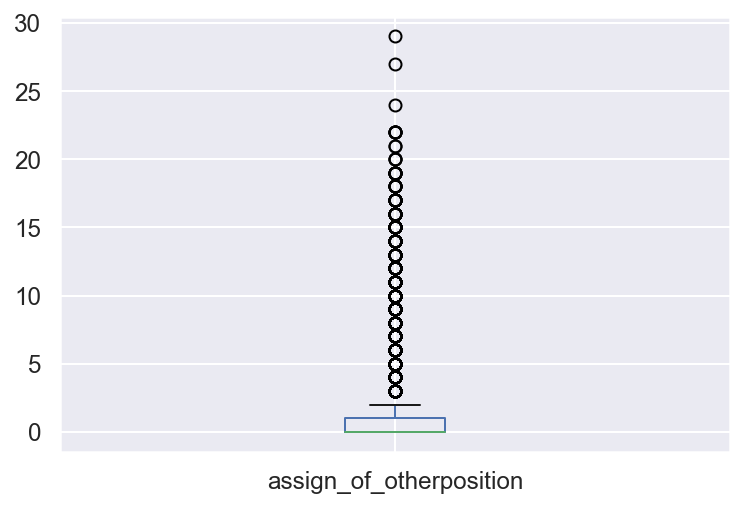

In [291]:
df['assign_of_otherposition'].plot.box();

In [292]:
outlierRatio(df['assign_of_otherposition'])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

divide by zero encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

invalid value encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning:

invalid value encountered in greater

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

divide by zero encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

invalid value encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning:

invalid value encountered in greater



{'percentile_based_outlier': [227, '2.04%'],
 'mad_based_outlier': [3850, '34.52%'],
 'std_div': [1781, '15.97%'],
 'outlierVote': [1781, '15.97%']}

### 19. Annual Leave

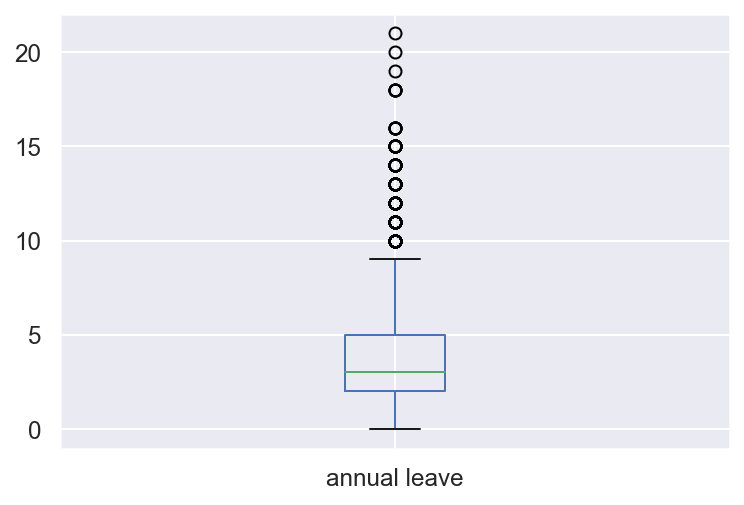

In [293]:
df['annual leave'].plot.box();

In [294]:
collections.Counter(df['annual leave'])

Counter({3: 2698,
         0: 1447,
         2: 1497,
         4: 1154,
         8: 405,
         9: 240,
         11: 77,
         5: 1333,
         10: 146,
         6: 847,
         1: 705,
         7: 479,
         15: 10,
         13: 25,
         14: 14,
         19: 1,
         12: 64,
         16: 5,
         20: 1,
         18: 4,
         21: 1})

In [295]:
# According to the company rules, the annual leaves couldn't be more than 12
# Therefore, the value of annual leaves that is above 12 will be changed to 12
annual_leaves_new = []
for val in df['annual leave']:
    if val > 12:
        annual_leaves_new.append(12)
    else:
        annual_leaves_new.append(val)
df['annual leave'] = annual_leaves_new

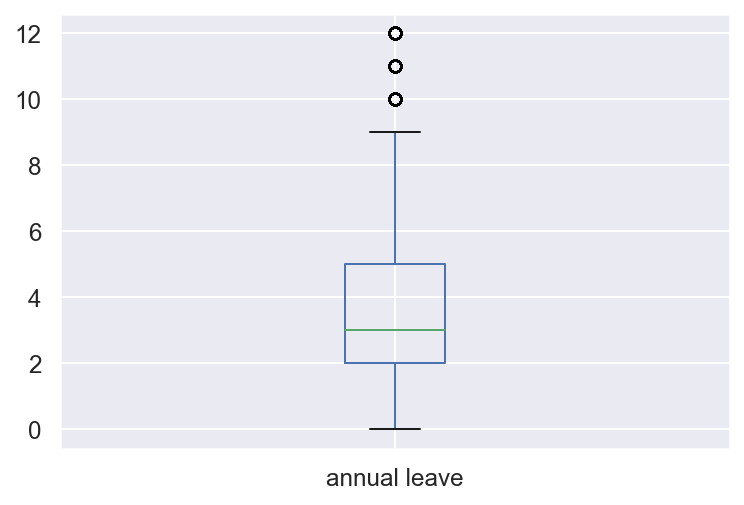

In [296]:
df['annual leave'].plot.box();

In [297]:
outlierRatio(df['annual leave'])

{'percentile_based_outlier': [202, '1.81%'],
 'mad_based_outlier': [0, '0.00%'],
 'std_div': [7504, '67.28%'],
 'outlierVote': [202, '1.81%']}

### 20. Sick Leaves

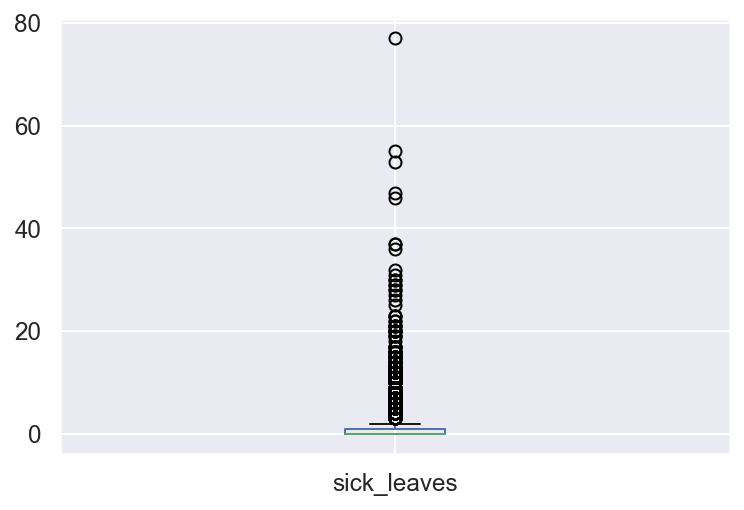

In [298]:
df['sick_leaves'].plot.box();

In [299]:
collections.Counter(df['sick_leaves'])

Counter({0: 7196,
         1: 1496,
         10: 42,
         4: 286,
         3: 499,
         5: 193,
         6: 139,
         2: 958,
         11: 28,
         14: 10,
         17: 5,
         7: 99,
         9: 41,
         8: 64,
         13: 16,
         12: 22,
         15: 12,
         23: 3,
         20: 6,
         16: 9,
         46: 1,
         21: 4,
         18: 1,
         19: 3,
         77: 1,
         30: 2,
         28: 2,
         22: 2,
         55: 1,
         29: 2,
         26: 1,
         37: 2,
         47: 1,
         32: 1,
         36: 1,
         31: 1,
         27: 1,
         53: 1,
         25: 1})

In [300]:
df[df['sick_leaves'] > 12]

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance,age_from_2020,year_graduated_from_2020
65,JG04,1.473092,PG03,1.473092,1.191638,RM_type_A,2,1986,Y,0,level_1,3.07,2004,6,6,3,0,5,14,112.79,3.0,1,34,16
210,JG04,1.081665,PG03,1.081665,0.707107,RM_type_B,1,1988,Y,3,level_3,3.09,2009,3,3,4,0,0,17,56.82,0.0,0,32,11
378,JG04,1.414214,PG03,1.414214,0.500000,RM_type_A,1,1989,N,0,level_3,3.28,2010,6,5,4,0,5,17,49.61,0.0,0,31,10
389,JG04,1.292285,PG03,1.292285,1.224745,RM_type_B,2,1988,Y,1,level_3,3.07,2010,2,2,2,0,0,13,13.24,0.0,1,32,10
670,JG04,1.658312,PG03,1.658312,0.707107,RM_type_A,2,1985,N,0,level_3,3.07,2008,5,3,3,0,2,15,32.87,0.0,0,35,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9732,JG04,2.828427,PG04,2.121320,1.581139,RM_type_A,1,1974,Y,0,level_4,3.06,1999,19,9,8,1,0,53,74.27,0.0,0,46,21
10853,JG04,1.256981,PG03,1.256981,1.224745,RM_type_B,1,1986,Y,0,level_4,2.75,2009,4,2,2,0,5,14,58.09,0.0,0,34,11
11042,JG04,1.473092,PG03,1.473092,1.224745,RM_type_A,1,1984,Y,0,level_4,3.06,2006,7,4,4,12,0,25,44.13,0.0,0,36,14
11079,JG04,1.385641,PG03,1.385641,0.707107,RM_type_A,2,1986,Y,1,level_4,3.53,2008,7,4,4,0,6,14,66.82,0.0,0,34,12


In [303]:
# According to the company rules, the sick leaves couldn't be more than 12
# Therefore, the value of sick leaves that is above 12 will be changed to 12
sick_leaves_new = []
for val in df['sick_leaves']:
    if val > 12:
        sick_leaves_new.append(12)
    else:
        sick_leaves_new.append(val)
df['sick_leaves'] = sick_leaves_new

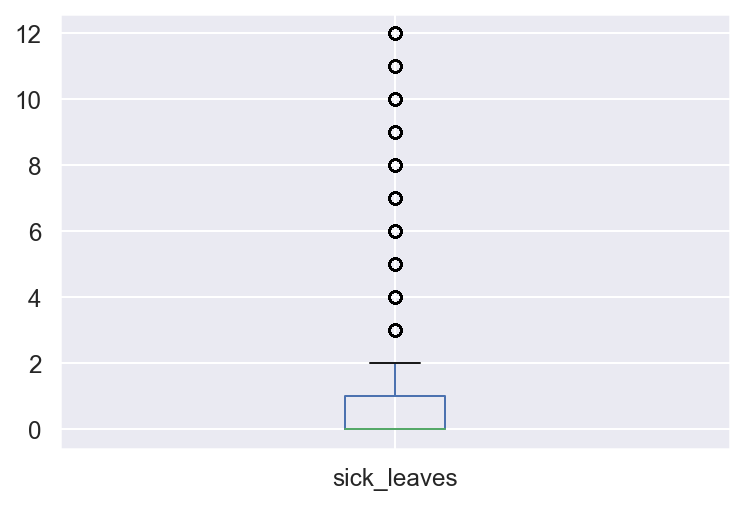

In [304]:
df['sick_leaves'].plot.box();

In [305]:
outlierRatio(df['sick_leaves'])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

invalid value encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

divide by zero encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning:

invalid value encountered in greater

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

invalid value encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning:

divide by zero encountered in true_divide

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning:

invalid value encountered in greater



{'percentile_based_outlier': [223, '2.00%'],
 'mad_based_outlier': [3957, '35.48%'],
 'std_div': [1503, '13.48%'],
 'outlierVote': [1503, '13.48%']}

### 21. Last Achievement (%)

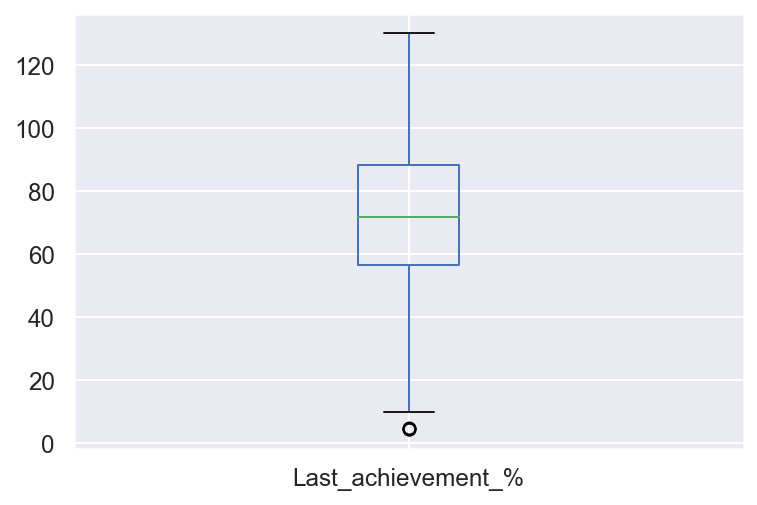

In [306]:
df['Last_achievement_%'].plot.box();

In [308]:
collections.Counter(df['Last_achievement_%'])

Counter({46.37: 1,
         47.68: 3,
         40.73: 2,
         47.42: 2,
         47.18: 2,
         48.46: 2,
         60.38: 2,
         14.71: 1,
         26.76: 1,
         41.45: 1,
         46.3: 3,
         49.15: 6,
         44.93: 1,
         73.56: 4,
         41.8: 2,
         43.54: 2,
         31.08: 1,
         44.24: 2,
         25.86: 1,
         13.39: 2,
         34.79: 1,
         42.71: 3,
         53.71: 2,
         46.56: 2,
         45.16: 3,
         40.1: 1,
         42.6: 2,
         49.91: 1,
         13.71: 3,
         91.95: 2,
         64.05: 4,
         102.38: 3,
         97.3: 2,
         103.87: 1,
         78.2: 3,
         88.45: 1,
         66.03: 4,
         73.73: 3,
         70.74: 3,
         73.87: 2,
         28.33: 1,
         59.75: 4,
         88.32: 3,
         113.03: 3,
         121.61: 1,
         99.97: 4,
         105.86: 3,
         80.13: 2,
         88.74: 3,
         109.3: 2,
         101.21: 1,
         84.01: 5,
         109

In [309]:
outlierRatio(df['Last_achievement_%'])

{'percentile_based_outlier': [558, '5.00%'],
 'mad_based_outlier': [0, '0.00%'],
 'std_div': [10814, '96.96%'],
 'outlierVote': [279, '2.50%']}

### 22. Achievement Above 100% During Three Quartal

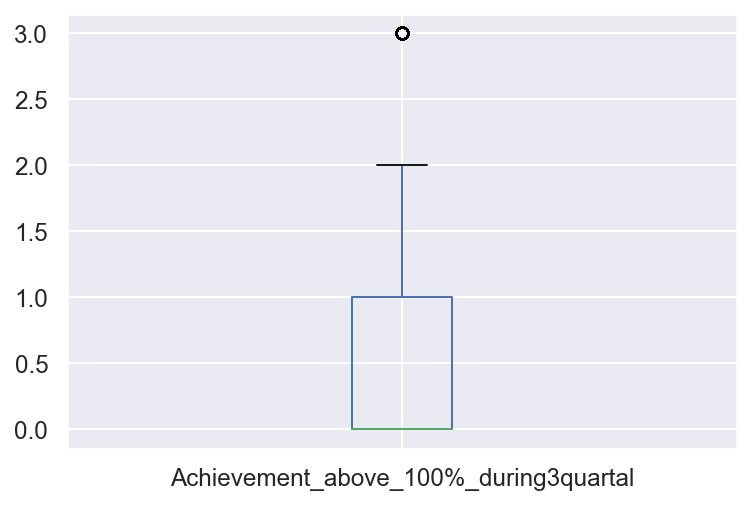

In [310]:
df['Achievement_above_100%_during3quartal'].plot.box();

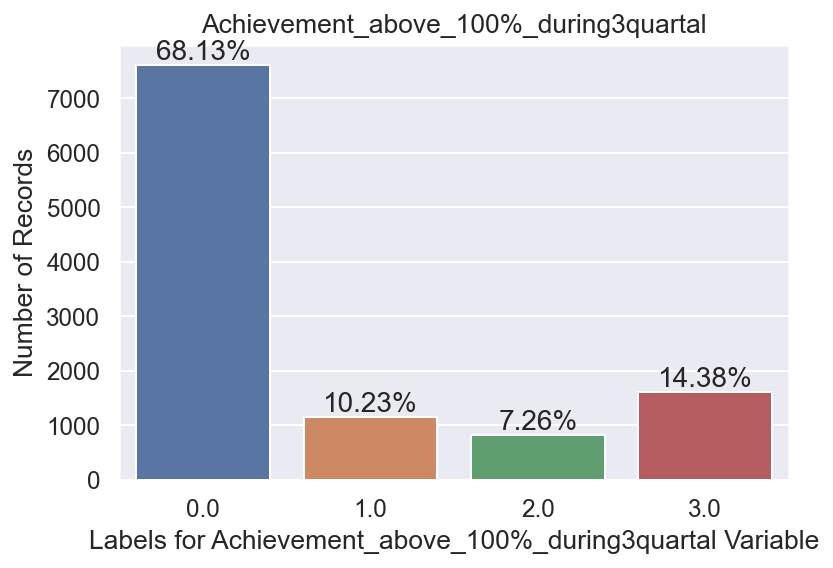

In [311]:
countplot('Achievement_above_100%_during3quartal');

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:40: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



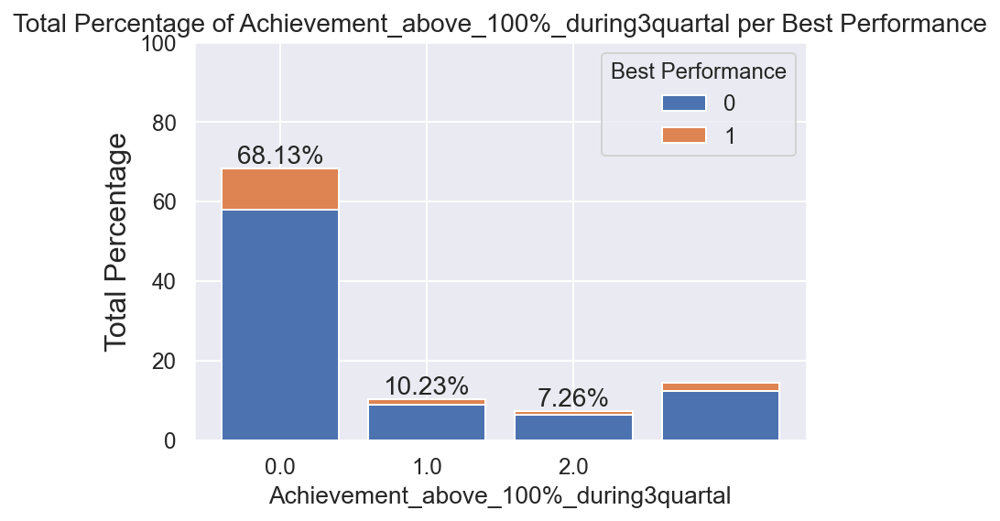

In [312]:
countplot_best_performance('Achievement_above_100%_during3quartal')

## Exploratory Data Analysis

In [313]:
# Checking the duplicated valeus
df.duplicated().sum()

0

In [314]:
# Checking Unique Values for Variable
print('Unique Values')
for i in df.columns:
    if df[i].dtypes != 'O':
        print(f'{i}: {df[i].nunique()}')

Unique Values
job_duration_in_current_job_level: 97
job_duration_in_current_person_level: 72
job_duration_in_current_branch: 69
gender: 2
age: 35
number_of_dependences: 7
GPA: 120
year_graduated: 38
job_duration_from_training: 31
branch_rotation: 19
job_rotation: 15
assign_of_otherposition: 26
annual leave: 13
sick_leaves: 13
Last_achievement_%: 6105
Achievement_above_100%_during3quartal: 4
Best Performance: 2
age_from_2020: 35
year_graduated_from_2020: 38


In [315]:
df.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance,age_from_2020,year_graduated_from_2020
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,Y,1,level_0,2.86,2011,4,2,3,2,3,0,46.37,0.0,0,35,9
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,Y,0,level_1,3.07,2007,4,4,3,0,0,1,47.68,0.0,0,31,13
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,Y,1,level_1,3.07,1989,28,10,9,6,2,1,40.73,0.0,0,50,31
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,Y,2,level_1,3.07,1987,29,11,6,0,4,10,47.42,0.0,1,53,33
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,Y,3,level_1,3.07,1985,30,9,8,2,3,0,47.18,0.0,0,55,35


### 1. Categorical Variables: Job Level, Person Level, Employee Type, Education Level, Marital Status

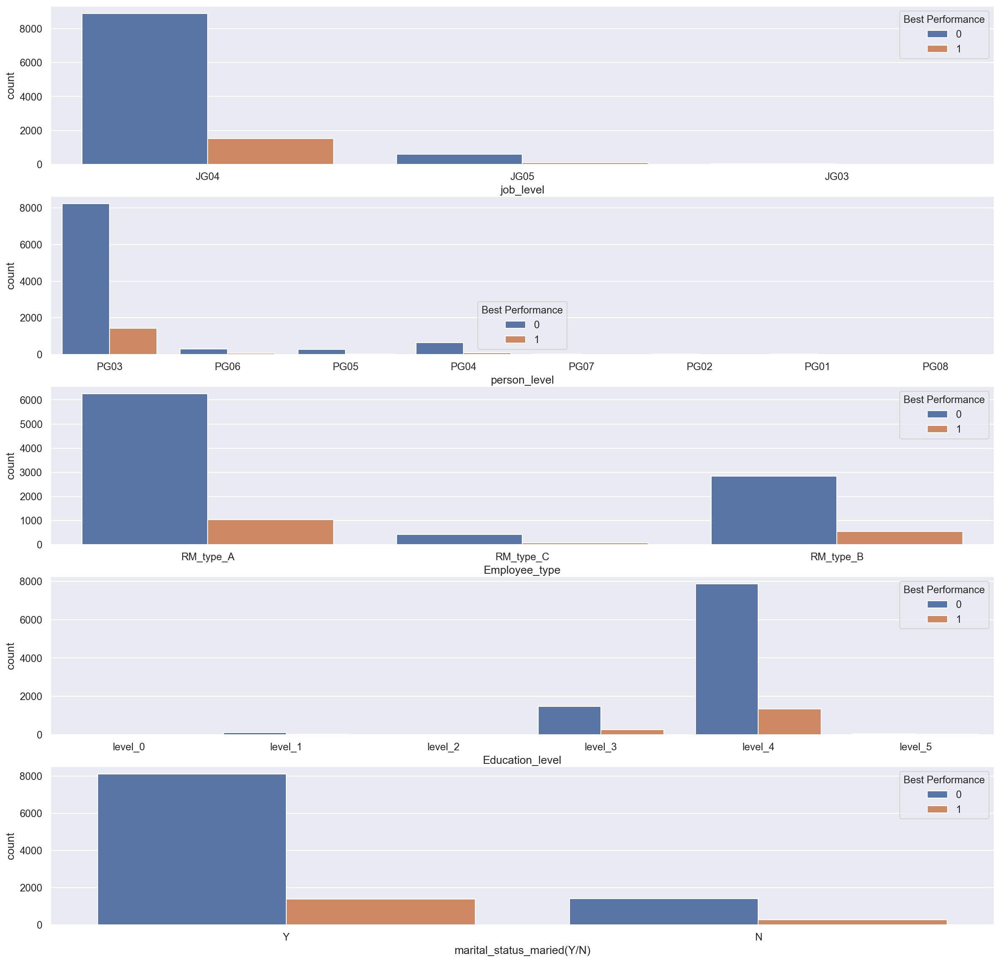

In [316]:
plt.figure(figsize=[20,20])
plt.subplot(511)
sns.countplot(x=df['job_level'],hue=df['Best Performance'])
plt.subplot(512)
sns.countplot(x=df['person_level'],hue=df['Best Performance'])
plt.legend(title='Best Performance')
plt.subplot(513)
sns.countplot(x=df['Employee_type'],hue=df['Best Performance'])
plt.subplot(514)
sns.countplot(x=df['Education_level'],hue=df["Best Performance"])
plt.subplot(515)
sns.countplot(x=df['marital_status_maried(Y/N)'],hue=df["Best Performance"])
plt.show()

|Job Level|Jabatan|
|:--:|:--:|
|JG03|Petugas ADK|
|JG04|Mantri/RM Dana Ritel|
|JG05|RM Kredit (Kecil, Program, Briguna dan Konsumer)|

*RM: Relationship Manager

Jabatan JG03:
1. Pendidikan D1 s.d. D4 dari Universitas/Perguruan Tinggi Akreditasi "A" dengan IPK min. 2.75 (skala 4)
2. Usia maksimal 22 tahun (berulan tahun ke-23 pada saat seleksi awal)
3. Surat Keterangan Catatan Kepolisian (SKCK)
4. Bersedia ditempatkan di seluruh Unit Kerja BRI
5. Diutamakan berdomisili di Unit Kerja Setempat

Jabatan JG4 s.d. JG5:
1. Diutamakan Pendidikan S1 dari Universitas/Perguruan Tinggi Akreditasi "A" dengan IPK min. 2.75 (skala 4)
2. Lulusan D3 usia maksimal 22 tahun (berulan tahun ke-23 pada saat seleksi awal), lulusan S1 usia maksimal 25 tahun (belum berulang tahun ke-26 pada saat seleksi awal)
3. Surat Keterangan Catatan Kepolisian (SKCK)
4. Bersedia ditempatkan di seluruh Unit Kerja BRI
5. Diutamakan berdomisili di Unit Kerja Setempat

sumber: https://www.scribd.com/document/476514672/Rekrutmen

In [321]:
df.groupby('job_level')['job_duration_in_current_job_level'].agg({'mean', 'median', 'max', 'min'})

,mean,median,max,min
job_level,,,,
JG03,1.987723,2.141169,2.677686,0.0
JG04,1.409027,1.352775,2.958040,0.0
JG05,1.762521,1.526434,2.858321,0.0


In [322]:
df.groupby('job_level')['job_duration_in_current_person_level'].agg({'mean', 'median', 'max', 'min'})

,mean,median,max,min
job_level,,,,
JG03,1.569459,1.593688,2.549510,0.0
JG04,1.346425,1.352775,2.828427,0.0
JG05,1.379270,1.172447,2.828427,0.0


In [323]:
df.groupby('job_level')['job_duration_in_current_branch'].agg({'mean', 'median', 'max', 'min'})

,mean,median,max,min
job_level,,,,
JG03,1.028585,1.191638,2.080865,0.0
JG04,1.031982,1.118034,2.677686,0.0
JG05,1.074360,1.224745,2.345208,0.0


In [325]:
pd.DataFrame(df.groupby(['job_level', 'gender'])['Best Performance'].count())

Best Performance
job_level gender                  
JG03      1                      8
          2                     28
JG04      1                   2678
          2                   7735
JG05      1                    263
          2                    441

In [326]:
pd.DataFrame(df.groupby(['job_level', 'age_from_2020'])['Best Performance'].count()).unstack()

Best Performance                                             \
age_from_2020               23   24   25    26    27     28     29     30   
job_level                                                                   
JG03                       NaN  NaN  NaN   NaN   NaN    1.0    1.0    2.0   
JG04                       1.0  4.0  7.0  16.0  55.0  191.0  509.0  924.0   
JG05                       NaN  NaN  NaN   NaN   NaN    NaN    1.0    NaN   

                                                                           \
age_from_2020      31      32      33      34     35     36     37     38   
job_level                                                                   
JG03              7.0     5.0     9.0     3.0    4.0    2.0    2.0    NaN   
JG04           1315.0  1553.0  1463.0  1339.0  943.0  648.0  442.0  249.0   
JG05              1.0     NaN     1.0     6.0    7.0    4.0   28.0   37.0   

                                                                             \
age_from_2020     39     40    41    42    43    44    45    46    47    48   
job_level                                                                     
JG03             NaN    NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
JG04           180.0  157.0  92.0  82.0  57.0  38.0  31.0  29.0  23.0  19.0   
JG05            60.0   71.0  62.0  39.0  35.0  35.0  24.0  18.0  22.0  16.0   

                                                                    
age_from_2020    49    50    51    52    53    54    55    56   57  
job_level                                                           
JG03            NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN  NaN  
JG04            7.0  11.0  11.0   6.0   4.0   2.0   2.0   3.0  NaN  
JG05           31.0  27.0  30.0  38.0  31.0  23.0  25.0  26.0  6.0

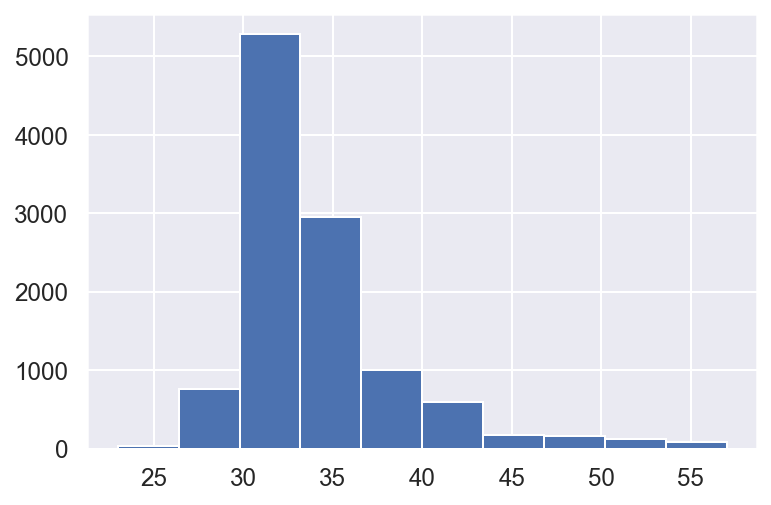

In [327]:
df['age_from_2020'].hist();

In [328]:
pd.DataFrame(df.groupby(['job_level', 'gender','marital_status_maried(Y/N)'])['Best Performance'].count()).unstack().unstack()

Best Performance                  
marital_status_maried(Y/N)                N           Y      
gender                                    1     2     1     2
job_level                                                    
JG03                                      2     5     6    23
JG04                                    496  1130  2182  6605
JG05                                      3    16   260   425

In [329]:
pd.DataFrame(df.groupby(['job_level', 'gender'])['Best Performance'].count()).unstack()

Best Performance      
gender                   1     2
job_level                       
JG03                     8    28
JG04                  2678  7735
JG05                   263   441

In [330]:
pd.DataFrame(df.groupby(['job_level', 'number_of_dependences'])['Best Performance'].count()).unstack()

Best Performance                                       
number_of_dependences                0       1       2      3     4    5    7
job_level                                                                    
JG03                              16.0    13.0     6.0    1.0   NaN  NaN  NaN
JG04                            3710.0  4062.0  2313.0  325.0   3.0  NaN  NaN
JG05                              53.0   110.0   355.0  171.0  10.0  4.0  1.0

In [331]:
pd.DataFrame(df.groupby(['job_level', 'GPA'])['Best Performance'].count()).unstack()

Best Performance                                                  \
GPA                   2.75  2.76  2.77  2.78  2.79  2.80  2.81  2.82  2.83   
job_level                                                                    
JG03                   NaN   NaN   NaN   NaN   NaN   3.0   2.0   NaN   NaN   
JG04                 210.0  71.0  42.0  43.0  51.0  63.0  54.0  57.0  61.0   
JG05                  42.0   7.0   NaN   3.0   4.0   4.0   2.0   2.0   3.0   

                                                                             \
GPA        2.84  2.85  2.86  2.87  2.88  2.89  2.90  2.91  2.92  2.93  2.94   
job_level                                                                     
JG03        NaN   1.0   NaN   2.0   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
JG04       58.0  82.0  66.0  55.0  75.0  78.0  87.0  61.0  68.0  91.0  51.0   
JG05        3.0   7.0   8.0   1.0   1.0   7.0   4.0   3.0   4.0  10.0   6.0   

                                                                            \
GPA        2.95  2.96  2.97  2.98  2.99   3.00   3.01   3.02   3.03   3.04   
job_level                                                                    
JG03        1.0   NaN   NaN   NaN   1.0    2.0    NaN    NaN    NaN    NaN   
JG04       83.0  60.0  85.0  92.0  76.0  361.0  221.0  135.0  178.0  109.0   
JG05        4.0   4.0   5.0   4.0   3.0   19.0    9.0    4.0    9.0    5.0   

                                                                           \
GPA         3.05   3.06    3.07   3.08   3.09   3.10   3.11   3.12   3.13   
job_level                                                                   
JG03         NaN    NaN     9.0    1.0    1.0    NaN    1.0    NaN    1.0   
JG04       151.0  117.0  2124.0  133.0  127.0  189.0  146.0  127.0  130.0   
JG05        16.0    6.0   196.0   12.0    8.0   10.0   12.0    2.0    8.0   

                                                                          \
GPA         3.14   3.15   3.16   3.17   3.18   3.19   3.20   3.21   3.22   
job_level                                                                  
JG03         NaN    1.0    NaN    NaN    1.0    NaN    2.0    NaN    NaN   
JG04       171.0  159.0  131.0  131.0  105.0  135.0  151.0  143.0  108.0   
JG05        14.0   10.0    6.0    7.0    9.0    6.0   11.0   13.0    8.0   

                                                                             \
GPA         3.23   3.24   3.25  3.26   3.27   3.28  3.29   3.30  3.31  3.32   
job_level                                                                     
JG03         NaN    NaN    NaN   1.0    NaN    NaN   NaN    NaN   NaN   NaN   
JG04       134.0  107.0  164.0  94.0  111.0  111.0  92.0  119.0  97.0  88.0   
JG05        10.0    3.0    4.0  10.0    4.0    5.0   5.0    6.0   9.0   6.0   

                                                                             \
GPA        3.33  3.34  3.35  3.36  3.37  3.38  3.39  3.40  3.41  3.42  3.43   
job_level                                                                     
JG03        1.0   2.0   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
JG04       97.0  96.0  84.0  78.0  69.0  80.0  53.0  93.0  59.0  57.0  60.0   
JG05        6.0   5.0   6.0   3.0   6.0   3.0   5.0   3.0   5.0   5.0   5.0   

                                                                             \
GPA        3.44  3.45  3.46  3.47  3.48  3.49  3.50  3.51  3.52  3.53  3.54   
job_level                                                                     
JG03        NaN   NaN   NaN   NaN   NaN   NaN   1.0   NaN   NaN   1.0   NaN   
JG04       50.0  57.0  57.0  50.0  49.0  48.0  49.0  65.0  62.0  45.0  49.0   
JG05        1.0   2.0   5.0   2.0   1.0   3.0   2.0   1.0   NaN   NaN   2.0   

                                                                             \
GPA        3.55  3.56  3.57  3.58  3.59  3.60  3.61  3.62  3.63  3.64  3.65   
job_level                                                                     
JG03        NaN

In [332]:
df.groupby('job_level')['GPA'].agg({'mean', 'median', 'max', 'min'})

,mean,median,max,min
job_level,,,,
JG03,3.090278,3.07,3.63,2.80
JG04,3.147586,3.07,3.97,2.75
JG05,3.113253,3.07,3.86,2.75


In [349]:
best_performance = pd.DataFrame(df.groupby(['job_level', 'person_level', 'Education_level', 'Employee_type', 'Best Performance'])['Best Performance'].count()).unstack().reset_index()
best_performance.columns = ['job_level', 'person_level', 'Education_level', 'Employee_type', '0', '1']

In [350]:
best_performance.head()

,job_level,person_level,Education_level,Employee_type,0,1
0,JG03,PG01,level_3,RM_type_A,3.0,NaN
1,JG03,PG01,level_4,RM_type_A,4.0,3.0
2,JG03,PG01,level_4,RM_type_B,7.0,2.0
3,JG03,PG02,level_3,RM_type_A,NaN,2.0
4,JG03,PG02,level_3,RM_type_B,4.0,NaN


In [355]:
fig = px.sunburst(best_performance, path=['job_level', 'person_level', 'Education_level'], values='1',
                  color='Employee_type', hover_data=['Employee_type'], title='Job Level, Person Level, Education Level with Best Performance 1')
fig.show()

In [357]:
fig = px.sunburst(best_performance, path=['job_level', 'person_level', 'Education_level'], values='0',
                  color='Employee_type', hover_data=['Employee_type'], title='Job Level, Person Level, Education Level with Best Performance 0')
fig.show()

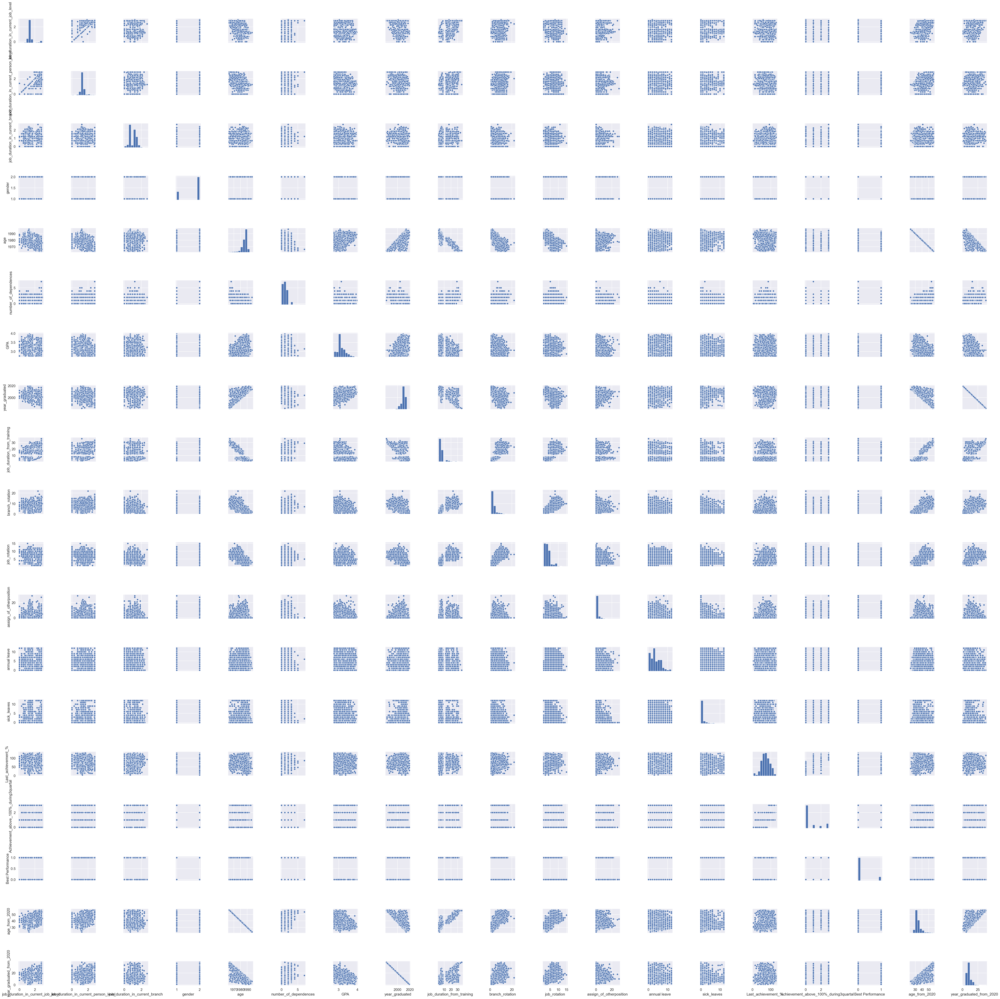

In [334]:
sns.pairplot(df);

In [ ]:
# from scipy import stats
# import numpy as np
# z = np.abs(stats.zscore(temp))
# print(z)

In [ ]:
# threshold = 3.5
# print(np.where(z > 3.5))

In [ ]:
# temp_df = temp_df[(z < 3).all(axis=1)]

## Feature Engineering

In [359]:
# df['job_level_enc'] = df.job_level.replace({'JG03': 0, 'JG04': 1, 'JG05': 2})
# df['person_level_enc'] = df.person_level.replace({'PG01': 0, 'PG02': 1, 'PG03': 2, 'PG04': 3, 'PG05': 4, 'PG06': 5, 'PG07': 6, 'PG08': 7})
# df['Education_level_enc'] = df['Education_level'].replace({'level_0': 0, 'level_1': 1, 'level_2': 2, 'level_3': 3, 'level_4': 4, 'level_5': 5})
# df['marital_status_enc'] = df['marital_status_maried(Y/N)'].replace({'Y': 1, 'N':0})
# df['Employee_type_enc'] = df['Employee_type'].replace({'RM_type_A': 0, 'RM_type_B': 1, 'RM_type_C': 2})


In [360]:
df.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance,age_from_2020,year_graduated_from_2020
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,Y,1,level_0,2.86,2011,4,2,3,2,3,0,46.37,0.0,0,35,9
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,Y,0,level_1,3.07,2007,4,4,3,0,0,1,47.68,0.0,0,31,13
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,Y,1,level_1,3.07,1989,28,10,9,6,2,1,40.73,0.0,0,50,31
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,Y,2,level_1,3.07,1987,29,11,6,0,4,10,47.42,0.0,1,53,33
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,Y,3,level_1,3.07,1985,30,9,8,2,3,0,47.18,0.0,0,55,35


In [361]:
df.columns

Index(['job_level', 'job_duration_in_current_job_level', 'person_level',
       'job_duration_in_current_person_level',
       'job_duration_in_current_branch', 'Employee_type', 'gender', 'age',
       'marital_status_maried(Y/N)', 'number_of_dependences',
       'Education_level', 'GPA', 'year_graduated',
       'job_duration_from_training', 'branch_rotation', 'job_rotation',
       'assign_of_otherposition', 'annual leave', 'sick_leaves',
       'Last_achievement_%', 'Achievement_above_100%_during3quartal',
       'Best Performance', 'age_from_2020', 'year_graduated_from_2020'],
      dtype='object')

In [389]:
# temp = df[['job_duration_in_current_job_level',
#        'job_duration_in_current_person_level',
#        'job_duration_in_current_branch', 'gender', 'age',
#        'number_of_dependences',
#         'GPA', 'year_graduated',
#        'job_duration_from_training', 'branch_rotation', 'job_rotation',
#        'assign_of_otherposition', 'annual leave', 'sick_leaves',
#        'Last_achievement_%', 'Achievement_above_100%_during3quartal',
#        'Best Performance', 'age_from_2020', 'year_graduated_from_2020',
#        'job_level_enc', 'person_level_enc', 'Education_level_enc',
#        'marital_status_enc',  'Employee_type_enc']]

In [395]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [396]:
korelasi = []
for i in list(df.columns):
    x = round((cramers_v(df['Best Performance'], df[i])),2)
    korelasi.append(x)

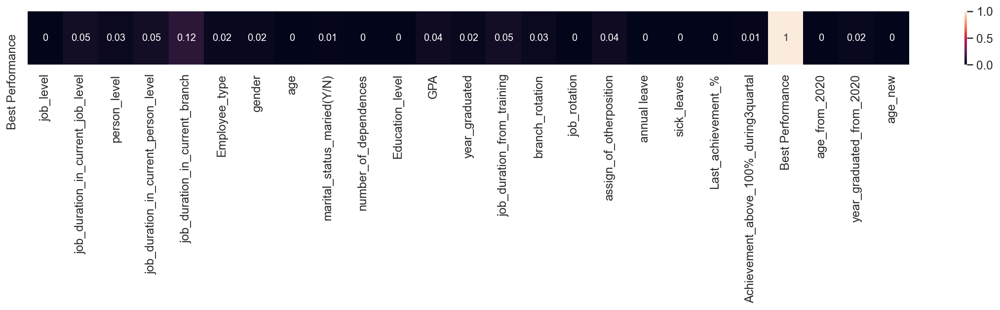

In [397]:
data = pd.DataFrame(data=[korelasi], columns=list(df.columns), index=['Best Performance'])
plt.figure(figsize=(20,1))
sns.heatmap(data, annot=True)
plt.show()

In [386]:
temp = df[['job_duration_in_current_person_level',
# 'person_level_enc',
          
'job_duration_in_current_branch',
'gender',
'number_of_dependences',
'age',
'job_duration_from_training',
'branch_rotation',
'annual leave',
'sick_leaves',
'Last_achievement_%',
# 'Employee_type_enc',
'assign_of_otherposition',
# 'marital_status_enc',
'GPA',
'year_graduated_from_2020',
'Achievement_above_100%_during3quartal',
#    'age_new_enc',

          ]]

In [387]:
def calc_vif(X):
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [388]:
calc_vif(temp)

,variables,VIF
0,job_duration_in_current_person_level,23.166142
1,job_duration_in_current_branch,7.937518
2,gender,18.095687
3,number_of_dependences,2.909412
4,age,330.821417
5,job_duration_from_training,14.264555
6,branch_rotation,13.889990
7,annual leave,3.012615
8,sick_leaves,1.274711
9,Last_achievement_%,23.990957


job_duration_in_current_branch, number_of_dependences, annual leave, sick_leaves, Employee_type_enc, assign_of_otherposition, marital_status_enc, Achievement_above_100%_during3quart 

According to Cramers Rule and VIF, we choose these variable:
1. job_duration_in_current_branch
2. number_of_dependences
3. annual leave
4. sick_leaves
5. Employee_type
6. assign_of_otherposition
7. marital_status_maried(Y/N)
8. Achievement_above_100%\_during3quartal
9. age

In [497]:
variables = df[['job_duration_in_current_branch',
           'number_of_dependences',
           'annual leave', 
           'sick_leaves',
           'Employee_type', 
           'assign_of_otherposition',
           'marital_status_maried(Y/N)', 
           'Achievement_above_100%_during3quartal', 
           'age'
           ]]

In [498]:
# df['age_new_enc'] = df.age_new.replace({'Muda': 0, 'Dewasa': 1, 'Tua': 2})

In [499]:
# temp = df[['job_duration_in_current_branch', 
#            'number_of_dependences', 
#            'annual leave', 
#            'sick_leaves', 
#            'Employee_type_enc', 
#            'assign_of_otherposition', 
#            'marital_status_enc', 
#            'Achievement_above_100%_during3quartal',
#            'age_new_enc']]

In [500]:
# # define min max scaler
# scaler = MinMaxScaler()
# # transform data
# temp_scaled = scaler.fit_transform(temp)
# print(temp_scaled)

## Assigning the Choosen Predictors to Variable X and Target to Variable y

In [536]:
X = variables
y = df['Best Performance']

## Random Oversampling Imbalanced Datasets

In [537]:
# define oversampling strategy
oversample = RandomOverSampler(sampling_strategy='minority')

In [538]:
# fit and apply the transform
X, y = oversample.fit_resample(X, y)

## Splitting Data 

In [539]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

## Creating Pipeline

In [540]:
cat_label_columns = ['Employee_type']
cat_age_columns = ['age']
cat_onehot_columns = ['marital_status_maried(Y/N)']
num_columns = ['job_duration_in_current_branch', 'number_of_dependences',
               'annual leave', 'sick_leaves','assign_of_otherposition',
               'Achievement_above_100%_during3quartal']

In [541]:
numerical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy='median')), 
    ("Scaler", RobustScaler())
])
categorical_age_pipeline = Pipeline([
    ("kbins", KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile'))
])
categorical_onehot_pipeline = Pipeline([
    ("encoder_onehot", OneHotEncoder())
])
categorical_label_pipeline = Pipeline([
    ("encoder_label", OrdinalEncoder())
])

In [542]:
X_train_num = numerical_pipeline.fit_transform(X_train[num_columns])
X_train_num

array([[ 0.20614959, -0.5       , -0.33333333,  0.        ,  0.        ,
         0.        ],
       [ 0.78896776,  0.        , -0.66666667,  0.        ,  0.        ,
         0.        ],
       [-0.79385041,  0.        , -0.66666667,  0.        ,  0.        ,
         0.        ],
       ...,
       [-0.07025875,  0.5       , -0.66666667,  0.        ,  0.        ,
         3.        ],
       [ 0.84538008, -0.5       ,  1.        ,  0.        ,  0.        ,
         2.        ],
       [ 0.51697636,  0.        ,  2.33333333,  0.        ,  0.        ,
         2.        ]])

In [543]:
X_train_cat_onehot = categorical_onehot_pipeline.fit_transform(X_train[cat_onehot_columns])

In [544]:
X_train_cat_label = categorical_label_pipeline.fit_transform(X_train[cat_label_columns])

In [545]:
X_train_age_bins = categorical_age_pipeline.fit_transform(X_train[cat_age_columns])

In [546]:
preprocessor = ColumnTransformer([
    ("numeric", numerical_pipeline, ['job_duration_in_current_branch', 'number_of_dependences',
               'annual leave', 'sick_leaves','assign_of_otherposition',
               'Achievement_above_100%_during3quartal']),
    ("categoric_onehot", categorical_onehot_pipeline, ['marital_status_maried(Y/N)']),
    ("categoric_ordinal", categorical_label_pipeline, ['Employee_type']),
    ("categoric_age", categorical_age_pipeline, ['age'])
])

In [579]:
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.fit_transform(X_test)

# Machine Learning Algorithm

## 1. KNearest Neighbors

In [548]:
model_KNN = Pipeline([
    ('prep', preprocessor),
    ('algo', KNeighborsClassifier())
])

In [549]:
model_KNN.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('Scaler',
                                                                   RobustScaler())]),
                                                  ['job_duration_in_current_branch',
                                                   'number_of_dependences',
                                                   'annual leave',
                                                   'sick_leaves',
                                                   'assign_of_otherposition',
                                                   'Achievement_above_100%_during3quartal']),
                                                 ('categoric_onehot',
                                   

In [550]:
model_KNN.score(X_test, y_test)

0.7362337116435477

In [646]:
y_pred_1 = model_KNN.predict(X_test)
test_labels_KNN = model_KNN.predict_proba(X_test)[:,1]

model_1_metrics = pd.DataFrame(data = 
             [accuracy_score(y_test, y_pred_1) * 100, 
              recall_score(y_test, y_pred_1) * 100,
              precision_score(y_test, y_pred_1) * 100, 
              roc_auc_score(y_test, test_labels_KNN) * 100,
              f1_score(y_test, y_pred_1) * 100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score KNearest Neighbors Default(%)'])
model_1_metrics

,Score KNearest Neighbors Default(%)
accuracy,73.623371
recall,86.961972
precision,68.816138
roc_auc_score,81.274710
f1_score,76.832195


In [647]:
model_1_train_test = pd.DataFrame(data = [model_KNN.score(X_train, y_train) * 100,
                    model_KNN.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score KNearest Neighbors Default (%)']
            )
model_1_train_test

,Score KNearest Neighbors Default (%)
Model Score in Data Train,81.841110
Model Score in Data Test,73.623371


In [665]:
print(classification_report(y_test, y_pred_1))

              precision    recall  f1-score   support

           0       0.82      0.60      0.69      2365
           1       0.69      0.87      0.77      2393

    accuracy                           0.74      4758
   macro avg       0.75      0.74      0.73      4758
weighted avg       0.75      0.74      0.73      4758



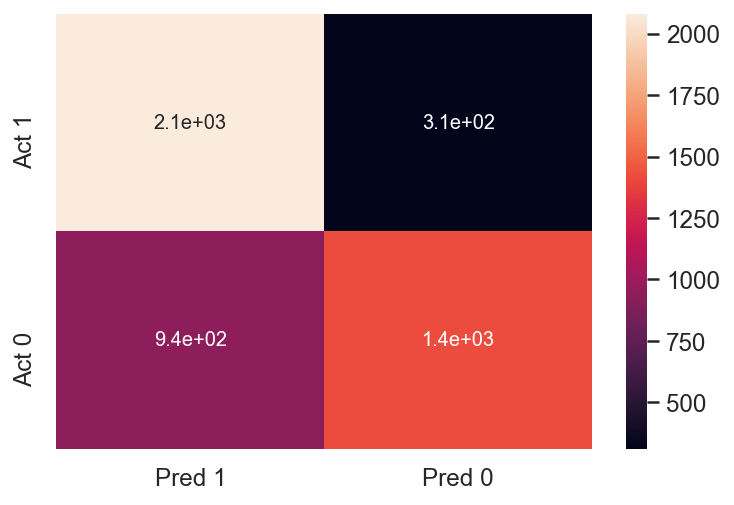

In [667]:
# KNN Before Tuning
cm = confusion_matrix(y_test, y_pred_1, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

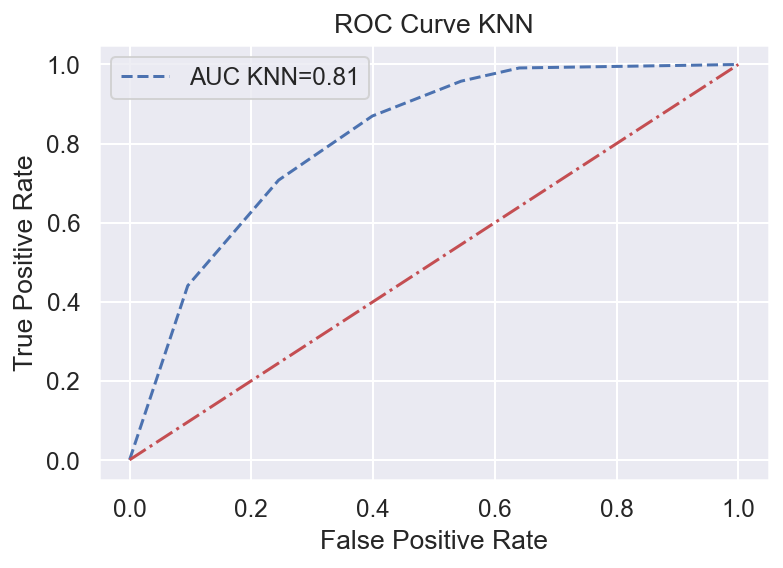

In [688]:
# calculate roc curves
fpr1, tpr1, _ = roc_curve(y_test, test_labels_KNN)
sc1 = round(auc(fpr1, tpr1),2)
# plot the roc curve for the model
plt.plot(fpr1, tpr1, linestyle='--', label=f'AUC KNN={sc1}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve KNN')
plt.legend();

## 1. a. KNearestNeighbors Hyperparameter Tuning

In [600]:
k = round((len(X_train)) ** 0.5) + 1

paramk = {
    'n_neighbors' : range(k-round(k/2) , k*2), 
    'weights' : ['uniform', 'distance']
}

In [601]:
modelKNN_RSCV= RandomizedSearchCV(estimator = KNeighborsClassifier(), param_distributions = paramk, cv = 5)
modelKNN_RSCV.fit(X_train_preprocessed, y_train)
modelKNN_RSCV.best_params_

{'weights': 'distance', 'n_neighbors': 216}

In [602]:
modelKNN_RSCV.score(X_test_preprocessed, y_test)

0.7463219840269021

In [633]:
# Input the best param as the parameters
model1_tuning = KNeighborsClassifier(weights= 'distance', n_neighbors= 216)
model1_tuning.fit(X_train_preprocessed, y_train)

KNeighborsClassifier(n_neighbors=216, weights='distance')

In [654]:
y_pred1_tuning = model1_tuning.predict(X_test_preprocessed)
test_labels_KNNRSCV = model1_tuning.predict_proba(X_test_preprocessed)[:,1]

model_1_tuning_metrics = pd.DataFrame(data = [
    accuracy_score(y_test, y_pred1_tuning) * 100, 
    recall_score(y_test, y_pred1_tuning) * 100,
    precision_score(y_test, y_pred1_tuning) * 100, 
    roc_auc_score(y_test, test_labels_KNNRSCV) * 100,
    f1_score(y_test, y_pred1_tuning) * 100],
index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score KNearest Neighbors with Tuning (%)'])
model_1_tuning_metrics

,Score KNearest Neighbors with Tuning (%)
accuracy,74.632198
recall,91.015462
precision,68.706625
roc_auc_score,90.905866
f1_score,78.303074


In [655]:
model_1_tuning_train_test = pd.DataFrame(data = [model1_tuning.score(X_train_preprocessed, y_train)*100,
                    model1_tuning.score(X_test_preprocessed, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score KNearest Neighbors with Tuning (%)']
            )
model_1_tuning_train_test

,Score KNearest Neighbors with Tuning (%)
Model Score in Data Train,94.612582
Model Score in Data Test,74.632198


In [668]:
print(classification_report(y_test, y_pred1_tuning))

              precision    recall  f1-score   support

           0       0.86      0.58      0.69      2365
           1       0.69      0.91      0.78      2393

    accuracy                           0.75      4758
   macro avg       0.78      0.75      0.74      4758
weighted avg       0.78      0.75      0.74      4758



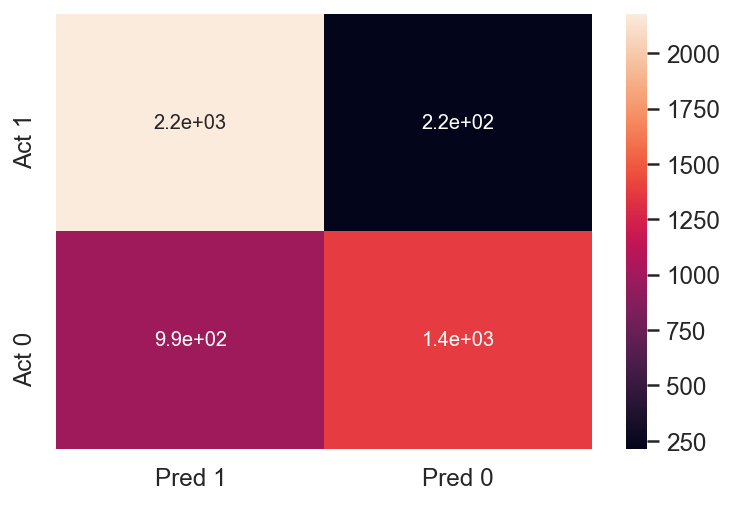

In [670]:
# KNN After Tuning
cm = confusion_matrix(y_test, y_pred1_tuning, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

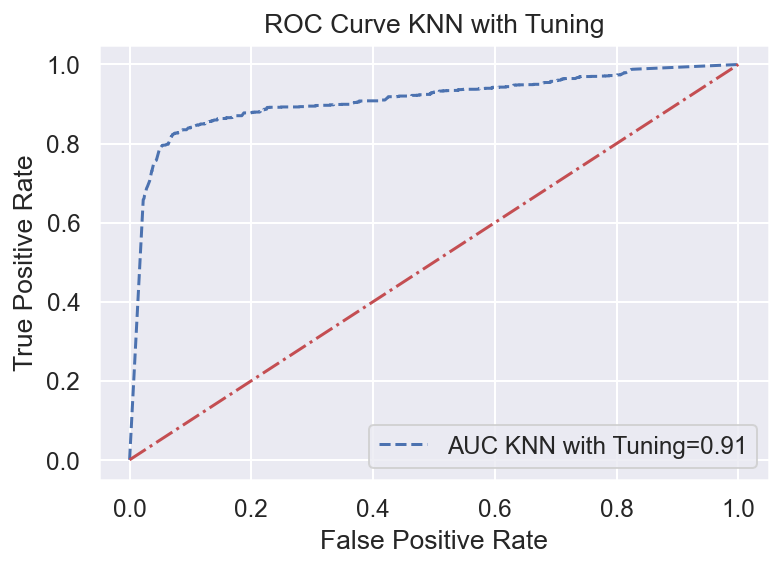

In [690]:
# calculate roc curves
fpr2, tpr2, _ = roc_curve(y_test, test_labels_KNNRSCV)
sc2 = round(auc(fpr2, tpr2),2)
# plot the roc curve for the model
plt.plot(fpr2, tpr2, linestyle='--', label=f'AUC KNN with Tuning={sc2}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve KNN with Tuning')
plt.legend();

## 2. Random Forest Classifier

In [605]:
model_RF = Pipeline([
    ('prep', preprocessor),
    ('algo', RandomForestClassifier())
])

In [606]:
model_RF.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('Scaler',
                                                                   RobustScaler())]),
                                                  ['job_duration_in_current_branch',
                                                   'number_of_dependences',
                                                   'annual leave',
                                                   'sick_leaves',
                                                   'assign_of_otherposition',
                                                   'Achievement_above_100%_during3quartal']),
                                                 ('categoric_onehot',
                                   

In [607]:
model_RF.score(X_test, y_test)

0.8921815889029003

In [644]:
y_pred_2 = model_RF.predict(X_test)
test_labels_RF = model_RF.predict_proba(X_test)[:,1]

model_2_metrics = pd.DataFrame(data = 
             [accuracy_score(y_test, y_pred_2) * 100, 
              recall_score(y_test, y_pred_2) * 100,
              precision_score(y_test, y_pred_2) * 100, 
              roc_auc_score(y_test, test_labels_RF) * 100,
              f1_score(y_test, y_pred_2) * 100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score Random Forest Classifier Default(%)'])
model_2_metrics

,Score Random Forest Classifier Default(%)
accuracy,89.218159
recall,95.027163
precision,85.232384
roc_auc_score,95.916870
f1_score,89.863663


In [645]:
model_2_train_test = pd.DataFrame(
        data = [model_RF.score(X_train, y_train) * 100,
                model_RF.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score Random Forest Classifier Default (%)']
            )
model_2_train_test

,Score Random Forest Classifier Default (%)
Model Score in Data Train,94.612582
Model Score in Data Test,89.218159


In [671]:
# Before Tuning: y_pred_2
print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.94      0.83      0.88      2365
           1       0.85      0.95      0.90      2393

    accuracy                           0.89      4758
   macro avg       0.90      0.89      0.89      4758
weighted avg       0.90      0.89      0.89      4758



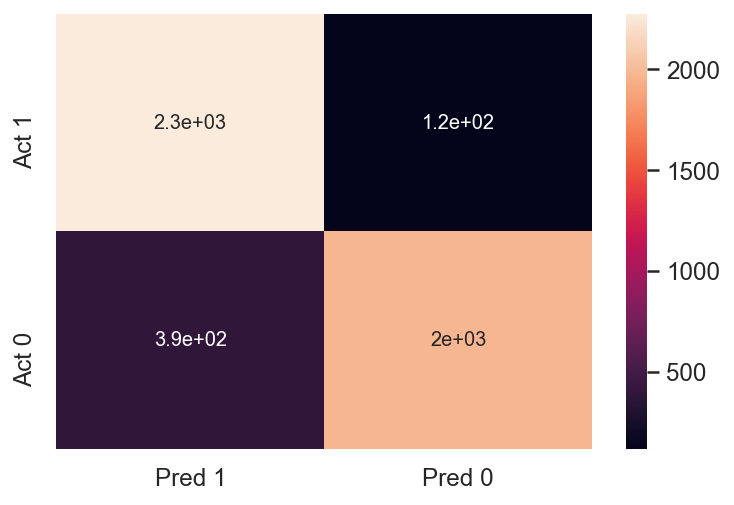

In [673]:
# Random Forest Before Tuning
cm = confusion_matrix(y_test, y_pred_2, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

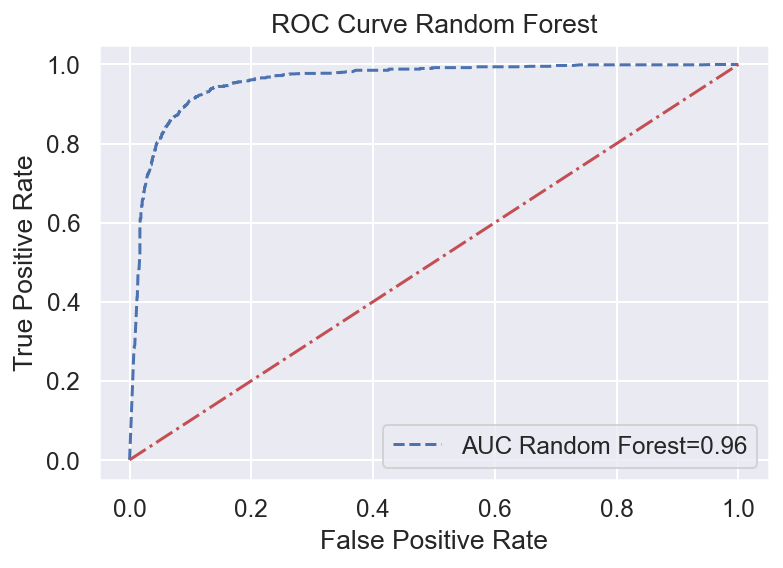

In [692]:
# calculate roc curves
fpr3, tpr3, _ = roc_curve(y_test, test_labels_RF)
sc3 = round(auc(fpr3, tpr3),2)
# plot the roc curve for the model
plt.plot(fpr3, tpr3, linestyle='--', label=f'AUC Random Forest={sc3}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve Random Forest')
plt.legend();

## 2. a. Hyperparameter Tuning Random Forest Classifier

In [610]:
paramrf = {
    'n_estimators': [100, 200, 250, 300, 400, 500],
    'max_features': ['sqrt', 'log2']
}

In [611]:
model_RFRSCV= RandomizedSearchCV(estimator = RandomForestClassifier(), param_distributions = paramrf, cv = 5)
model_RFRSCV.fit(X_train_preprocessed, y_train)
model_RFRSCV.best_params_

{'n_estimators': 250, 'max_features': 'log2'}

In [612]:
model_RFRSCV.score(X_test_preprocessed, y_test)

0.876839007986549

In [656]:
# Input the best param as the parameters
model2_tuning = RandomForestClassifier(n_estimators= 250, max_features= 'log2')
model2_tuning.fit(X_train_preprocessed, y_train)

RandomForestClassifier(max_features='log2', n_estimators=250)

In [657]:
y_pred2_tuning = model2_tuning.predict(X_test_preprocessed)
test_labels_RFRSCV = model2_tuning.predict_proba(X_test_preprocessed)[:,1]

model_2_tuning_metrics = pd.DataFrame(data = [
    accuracy_score(y_test, y_pred2_tuning) * 100, 
    recall_score(y_test, y_pred2_tuning) * 100,
    precision_score(y_test, y_pred2_tuning) * 100, 
    roc_auc_score(y_test, test_labels_RFRSCV) * 100,
    f1_score(y_test, y_pred2_tuning) * 100],
index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score Random Forest Classifier with Tuning (%)'])
model_2_tuning_metrics

,Score Random Forest Classifier with Tuning (%)
accuracy,87.431694
recall,90.722942
precision,85.237534
roc_auc_score,94.119468
f1_score,87.894737


In [658]:
model_2_tuning_train_test = pd.DataFrame(data = [model2_tuning.score(X_train_preprocessed, y_train)*100,
                    model2_tuning.score(X_test_preprocessed, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score Random Forest Classifier with Tuning (%)']
            )
model_2_tuning_train_test

,Score Random Forest Classifier with Tuning (%)
Model Score in Data Train,94.612582
Model Score in Data Test,87.431694


In [674]:
print(classification_report(y_test, y_pred2_tuning))

              precision    recall  f1-score   support

           0       0.90      0.84      0.87      2365
           1       0.85      0.91      0.88      2393

    accuracy                           0.87      4758
   macro avg       0.88      0.87      0.87      4758
weighted avg       0.88      0.87      0.87      4758



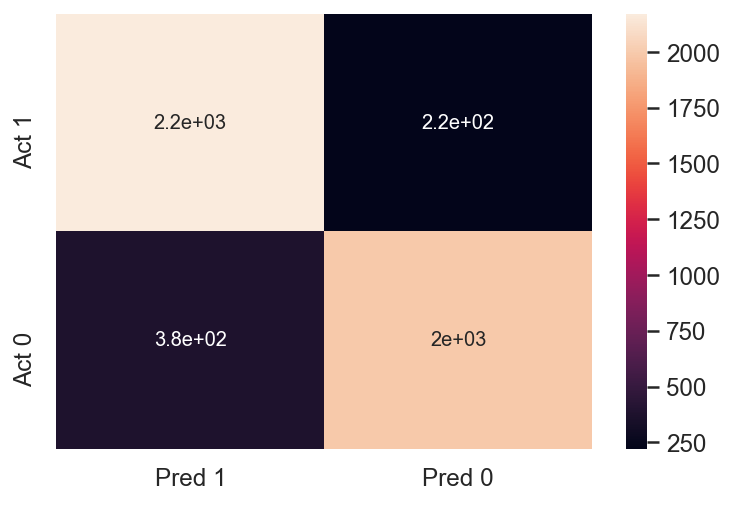

In [676]:
# Random Forest After Tuning
cm = confusion_matrix(y_test, y_pred2_tuning, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

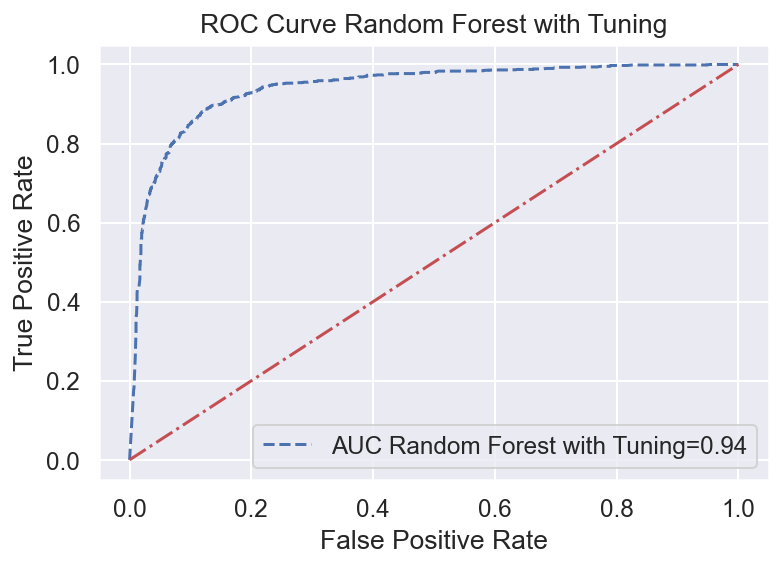

In [691]:
# calculate roc curves
fpr4, tpr4, _ = roc_curve(y_test, test_labels_RFRSCV)
sc4 = round(auc(fpr4, tpr4),2)
# plot the roc curve for the model
plt.plot(fpr4, tpr4, linestyle='--', label=f'AUC Random Forest with Tuning={sc4}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve Random Forest with Tuning')
plt.legend();

## 3. Logistic Regression

In [615]:
model_LR = Pipeline([
    ('prep', preprocessor),
    ('algo', LogisticRegression())
])

In [616]:
model_LR.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('Scaler',
                                                                   RobustScaler())]),
                                                  ['job_duration_in_current_branch',
                                                   'number_of_dependences',
                                                   'annual leave',
                                                   'sick_leaves',
                                                   'assign_of_otherposition',
                                                   'Achievement_above_100%_during3quartal']),
                                                 ('categoric_onehot',
                                   

In [617]:
model_LR.score(X_test, y_test)

0.5042034468263976

In [660]:
y_pred_3 = model_LR.predict(X_test)
test_labels_LR = model_LR.predict_proba(X_test)[:,1]

model_3_metrics = pd.DataFrame(data = 
             [accuracy_score(y_test, y_pred_3) * 100, 
              recall_score(y_test, y_pred_3) * 100,
              precision_score(y_test, y_pred_3) * 100, 
              roc_auc_score(y_test, test_labels_LR) * 100,
              f1_score(y_test, y_pred_3) * 100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score Logistic Regression Default(%)'])
model_3_metrics

,Score Logistic Regression Default(%)
accuracy,50.420345
recall,44.003343
precision,50.820463
roc_auc_score,51.688143
f1_score,47.166853


In [661]:
model_3_train_test = pd.DataFrame(
        data = [model_LR.score(X_train, y_train) * 100,
                model_LR.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score Logistic Regression Default (%)']
            )
model_3_train_test

,Score Logistic Regression Default (%)
Model Score in Data Train,51.800476
Model Score in Data Test,50.420345


In [677]:
# Before Tuning: y_pred_3
print(classification_report(y_test, y_pred_3))

              precision    recall  f1-score   support

           0       0.50      0.57      0.53      2365
           1       0.51      0.44      0.47      2393

    accuracy                           0.50      4758
   macro avg       0.50      0.50      0.50      4758
weighted avg       0.50      0.50      0.50      4758



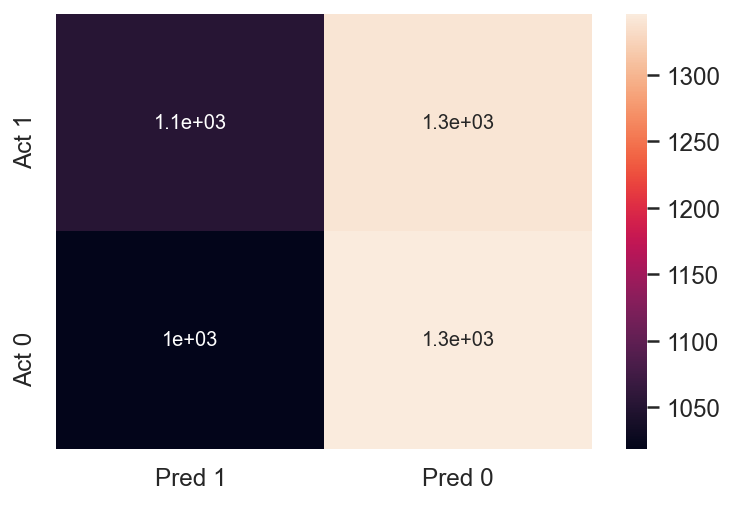

In [679]:
# Logistic Regression Before Tuning
cm = confusion_matrix(y_test, y_pred_3, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

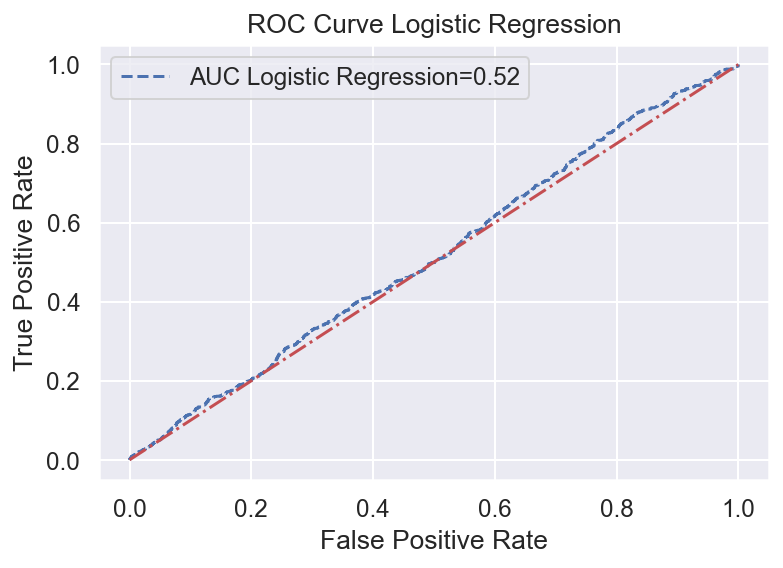

In [694]:
# calculate roc curves
fpr5, tpr5, _ = roc_curve(y_test, test_labels_LR)
sc5 = round(auc(fpr5, tpr5),2)
# plot the roc curve for the model
plt.plot(fpr5, tpr5, linestyle='--', label=f'AUC Logistic Regression={sc5}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve Logistic Regression')
plt.legend();

## 3. a. Hyperparameter Tuning Logistic Regression

In [620]:
penalty = ['l1', 'l2', 'elasticnet', 'none']
solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
max_iter= [1, 10, 100, 1000, 10000]
multi_class=['auto', 'ovr', 'multinomial']

paramlog = {
    'penalty': penalty,
    'solver':solver,
    'max_iter':max_iter,
    'multi_class':multi_class
}

In [622]:
model_LRRSCV = RandomizedSearchCV(estimator = LogisticRegression(), param_distributions = paramlog, cv = 5)
model_LRRSCV.fit(X_train_preprocessed, y_train)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.


/Library/Frameworks/Python.fr

RandomizedSearchCV(cv=5, estimator=LogisticRegression(),
                   param_distributions={'max_iter': [1, 10, 100, 1000, 10000],
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'penalty': ['l1', 'l2', 'elasticnet',
                                                    'none'],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']})

In [623]:
model_LRRSCV.best_params_

{'solver': 'liblinear', 'penalty': 'l1', 'multi_class': 'auto', 'max_iter': 10}

In [624]:
model_LRRSCV.score(X_test_preprocessed, y_test)

0.5050441361916772

In [662]:
# Input the best param as the parameters
model3_tuning = LogisticRegression(solver= 'liblinear', penalty= 'l1', multi_class= 'auto', max_iter= 10)
model3_tuning.fit(X_train_preprocessed, y_train)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/svm/_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



LogisticRegression(max_iter=10, penalty='l1', solver='liblinear')

In [663]:
y_pred3_tuning = model3_tuning.predict(X_test_preprocessed)
test_labels_LRRSCV = model3_tuning.predict_proba(X_test_preprocessed)[:,1]

model_3_tuning_metrics = pd.DataFrame(data = [
    accuracy_score(y_test, y_pred3_tuning) * 100, 
    recall_score(y_test, y_pred3_tuning) * 100,
    precision_score(y_test, y_pred3_tuning) * 100, 
    roc_auc_score(y_test, test_labels_LRRSCV) * 100,
    f1_score(y_test, y_pred3_tuning) * 100],
index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score Logistic Regression with Tuning (%)'])
model_3_tuning_metrics

,Score Logistic Regression with Tuning (%)
accuracy,50.504414
recall,44.755537
precision,50.903042
roc_auc_score,51.740224
f1_score,47.631755


In [664]:
model_3_tuning_train_test = pd.DataFrame(data = [model3_tuning.score(X_train_preprocessed, y_train)*100,
                    model3_tuning.score(X_test_preprocessed, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score Logistic Regression with Tuning (%)']
            )
model_3_tuning_train_test

,Score Logistic Regression with Tuning (%)
Model Score in Data Train,51.870534
Model Score in Data Test,50.504414


In [680]:
# After Tuning: y_pred3_tuning
print(classification_report(y_test, y_pred3_tuning))

              precision    recall  f1-score   support

           0       0.50      0.56      0.53      2365
           1       0.51      0.45      0.48      2393

    accuracy                           0.51      4758
   macro avg       0.51      0.51      0.50      4758
weighted avg       0.51      0.51      0.50      4758



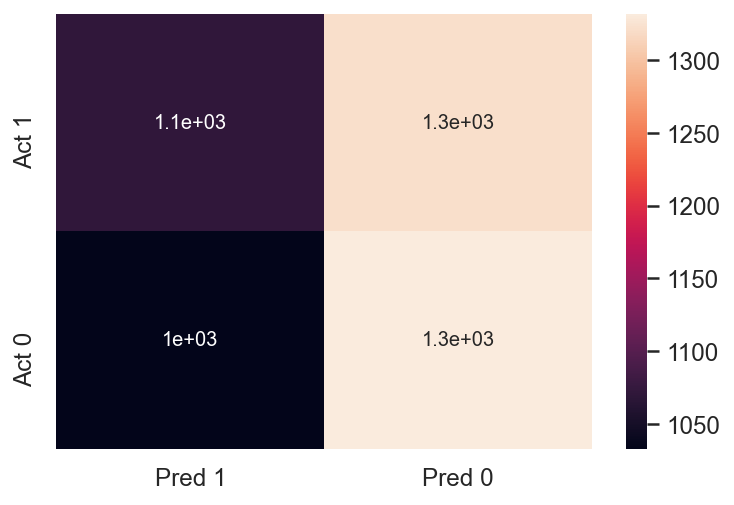

In [683]:
# Logistic Regression After Tuning
cm = confusion_matrix(y_test, y_pred3_tuning, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

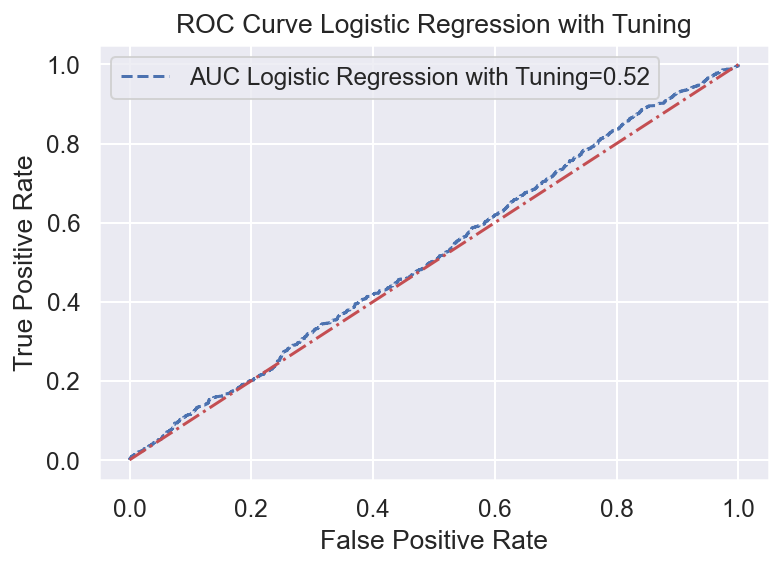

In [696]:
# calculate roc curves
fpr6, tpr6, _ = roc_curve(y_test, test_labels_LRRSCV)
sc6 = round(auc(fpr6, tpr6),2)
# plot the roc curve for the model
plt.plot(fpr6, tpr6, linestyle='--', label=f'AUC Logistic Regression with Tuning={sc6}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve Logistic Regression with Tuning')
plt.legend();

## 4. AdaBoost

In [699]:
model_Ada = Pipeline([
    ('prep', preprocessor),
    ('algo', AdaBoostClassifier())
])

In [700]:
model_Ada.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('Scaler',
                                                                   RobustScaler())]),
                                                  ['job_duration_in_current_branch',
                                                   'number_of_dependences',
                                                   'annual leave',
                                                   'sick_leaves',
                                                   'assign_of_otherposition',
                                                   'Achievement_above_100%_during3quartal']),
                                                 ('categoric_onehot',
                                   

In [701]:
model_Ada.score(X_test, y_test)

0.5683060109289617

In [704]:
test_labels_Ada = model_Ada.predict_proba(X_test)

In [705]:
y_pred_4 = model_Ada.predict(X_test)
test_labels_Ada = model_Ada.predict_proba(X_test)[:,1]

model_4_metrics = pd.DataFrame(data = 
             [accuracy_score(y_test, y_pred_4) * 100, 
              recall_score(y_test, y_pred_4) * 100,
              precision_score(y_test, y_pred_4) * 100, 
              roc_auc_score(y_test, test_labels_Ada) * 100,
              f1_score(y_test, y_pred_4) * 100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score Ada Boost Default(%)'])
model_4_metrics

,Score Ada Boost Default(%)
accuracy,56.830601
recall,50.438780
precision,58.168675
roc_auc_score,59.512337
f1_score,54.028648


In [706]:
model_4_train_test = pd.DataFrame(
        data = [model_Ada.score(X_train, y_train) * 100,
                model_Ada.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score AdaBoost Default (%)']
            )
model_4_train_test

,Score AdaBoost Default (%)
Model Score in Data Train,56.802578
Model Score in Data Test,56.830601


In [707]:
# Before Tuning: y_pred_3
print(classification_report(y_test, y_pred_4))

              precision    recall  f1-score   support

           0       0.56      0.63      0.59      2365
           1       0.58      0.50      0.54      2393

    accuracy                           0.57      4758
   macro avg       0.57      0.57      0.57      4758
weighted avg       0.57      0.57      0.57      4758



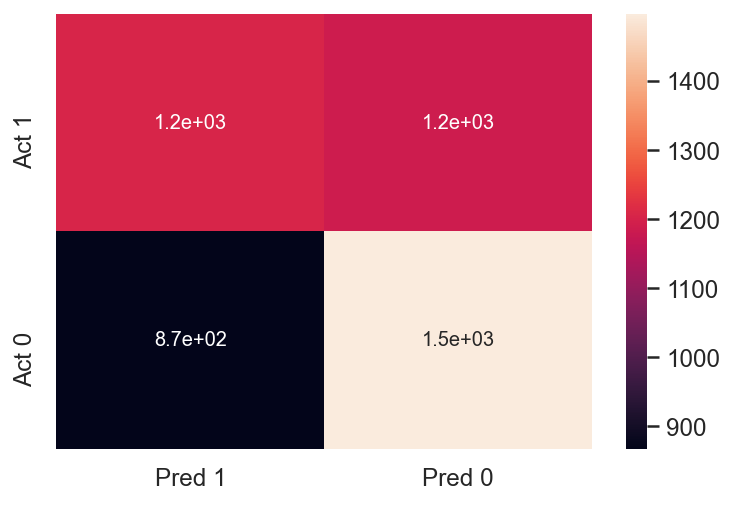

In [708]:
# Logistic Regression Before Tuning
cm = confusion_matrix(y_test, y_pred_4, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

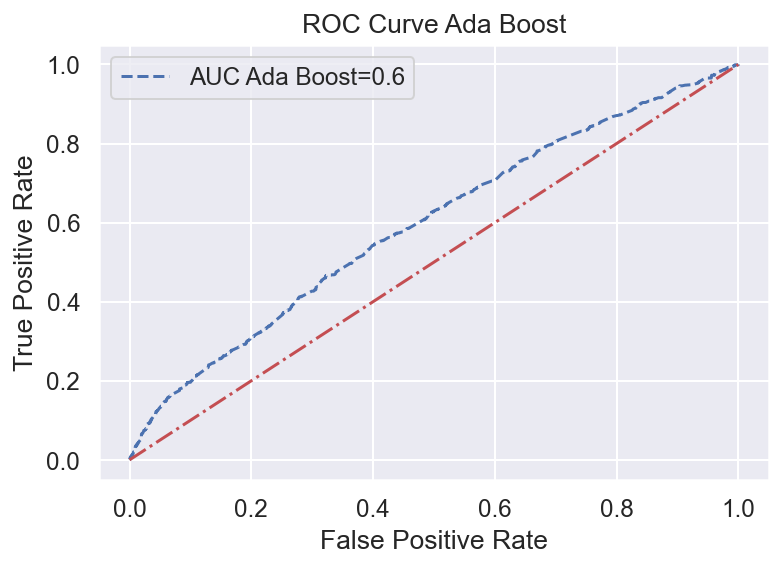

In [709]:
# calculate roc curves
fpr7, tpr7, _ = roc_curve(y_test, test_labels_Ada)
sc7 = round(auc(fpr7, tpr7),2)
# plot the roc curve for the model
plt.plot(fpr7, tpr7, linestyle='--', label=f'AUC Ada Boost={sc7}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve Ada Boost')
plt.legend();

## 4. a. Hyperparameter Tuning AdaBoost

In [711]:
param_grid_ada = {
    'n_estimators': [100, 200],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.5]
}

In [712]:
model_Ada = RandomizedSearchCV(estimator = AdaBoostClassifier(), param_distributions = param_grid_ada, cv = 5)
model_Ada.fit(X_train_preprocessed, y_train)

RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(),
                   param_distributions={'learning_rate': [0.001, 0.01, 0.1, 0.2,
                                                          0.5],
                                        'n_estimators': [100, 200]})

In [713]:
model_Ada.best_params_

{'n_estimators': 200, 'learning_rate': 0.5}

In [714]:
model_Ada.score(X_test_preprocessed, y_test)

0.5754518705338377

In [715]:
# Input the best param as the parameters
model4_tuning = AdaBoostClassifier(n_estimators= 200, learning_rate= 0.5)
model4_tuning.fit(X_train_preprocessed, y_train)

AdaBoostClassifier(learning_rate=0.5, n_estimators=200)

In [728]:
y_pred4_tuning = model4_tuning.predict(X_test_preprocessed)
test_labels_Ada = model4_tuning.predict_proba(X_test_preprocessed)[:,1]

model_4_tuning_metrics = pd.DataFrame(data = [
    accuracy_score(y_test, y_pred4_tuning) * 100, 
    recall_score(y_test, y_pred4_tuning) * 100,
    precision_score(y_test, y_pred4_tuning) * 100, 
    roc_auc_score(y_test, test_labels_Ada) * 100,
    f1_score(y_test, y_pred4_tuning) * 100],
index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score Ada Boost with Tuning (%)'])
model_4_tuning_metrics

,Score Ada Boost with Tuning (%)
accuracy,57.545187
recall,50.396991
precision,59.146641
roc_auc_score,59.917960
f1_score,54.422383


In [717]:
model_4_tuning_train_test = pd.DataFrame(data = [model4_tuning.score(X_train_preprocessed, y_train)*100,
                    model4_tuning.score(X_test_preprocessed, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score Ada Boost with Tuning (%)']
            )
model_4_tuning_train_test

,Score Ada Boost with Tuning (%)
Model Score in Data Train,57.026762
Model Score in Data Test,57.545187


In [718]:
# After Tuning: y_pred3_tuning
print(classification_report(y_test, y_pred4_tuning))

              precision    recall  f1-score   support

           0       0.56      0.65      0.60      2365
           1       0.59      0.50      0.54      2393

    accuracy                           0.58      4758
   macro avg       0.58      0.58      0.57      4758
weighted avg       0.58      0.58      0.57      4758



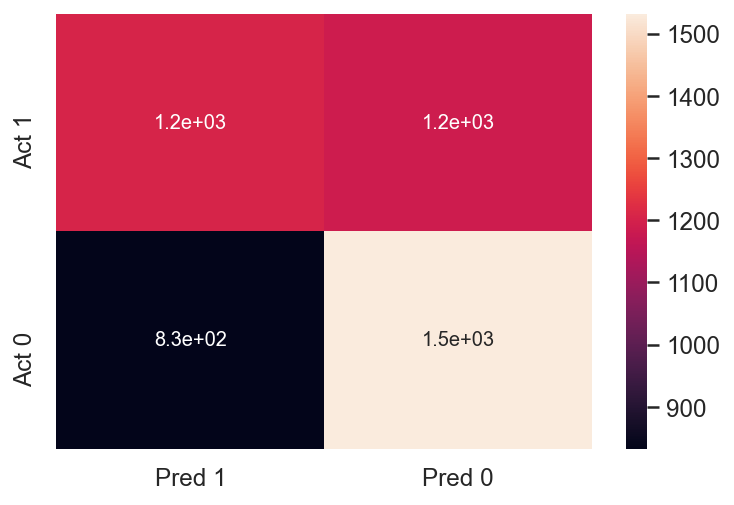

In [719]:
# Logistic Regression After Tuning
cm = confusion_matrix(y_test, y_pred4_tuning, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

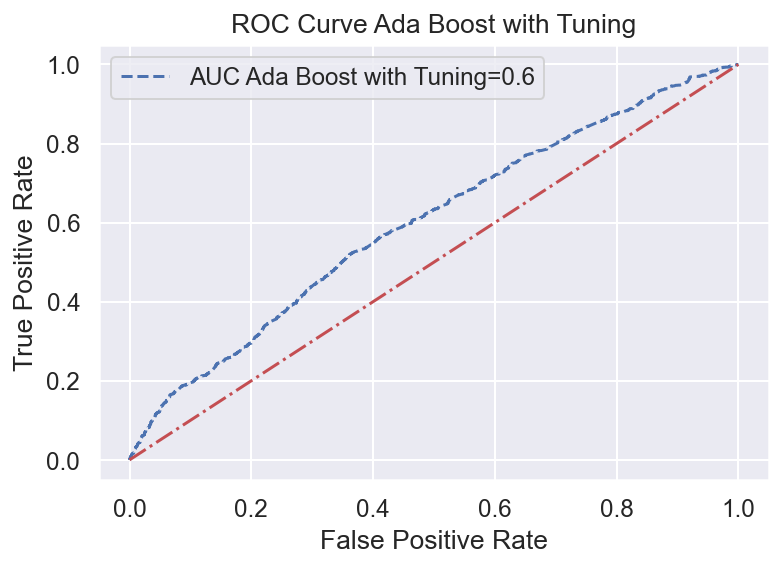

In [720]:
# calculate roc curves
fpr8, tpr8, _ = roc_curve(y_test, test_labels_Ada)
sc8 = round(auc(fpr8, tpr8),2)
# plot the roc curve for the model
plt.plot(fpr8, tpr8, linestyle='--', label=f'AUC Ada Boost with Tuning={sc8}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve Ada Boost with Tuning')
plt.legend();

## 5. XGBoost

In [723]:
model_XGB = Pipeline([
    ('prep', preprocessor),
    ('algo', XGBClassifier())
])

In [724]:
model_XGB.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('numeric',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('Scaler',
                                                                   RobustScaler())]),
                                                  ['job_duration_in_current_branch',
                                                   'number_of_dependences',
                                                   'annual leave',
                                                   'sick_leaves',
                                                   'assign_of_otherposition',
                                                   'Achievement_above_100%_during3quartal']),
                                                 ('categoric_onehot',
                                   

In [725]:
model_XGB.score(X_test, y_test)

0.7236233711643548

In [727]:
y_pred_5 = model_XGB.predict(X_test)
test_labels_XGB = model_XGB.predict_proba(X_test)[:,1]

model_5_metrics = pd.DataFrame(data = 
             [accuracy_score(y_test, y_pred_5) * 100, 
              recall_score(y_test, y_pred_5) * 100,
              precision_score(y_test, y_pred_5) * 100, 
              roc_auc_score(y_test, test_labels_XGB) * 100,
              f1_score(y_test, y_pred_5) * 100],
            index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score XGBoost Default(%)'])
model_5_metrics

,Score XGBoost Default(%)
accuracy,72.362337
recall,73.297117
precision,72.181070
roc_auc_score,81.503858
f1_score,72.734812


In [729]:
model_5_train_test = pd.DataFrame(
        data = [model_XGB.score(X_train, y_train) * 100,
                model_XGB.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['ScoreXGBoost Default (%)']
            )
model_5_train_test

,ScoreXGBoost Default (%)
Model Score in Data Train,78.667507
Model Score in Data Test,72.362337


In [730]:
# Before Tuning: y_pred_3
print(classification_report(y_test, y_pred_5))

              precision    recall  f1-score   support

           0       0.73      0.71      0.72      2365
           1       0.72      0.73      0.73      2393

    accuracy                           0.72      4758
   macro avg       0.72      0.72      0.72      4758
weighted avg       0.72      0.72      0.72      4758



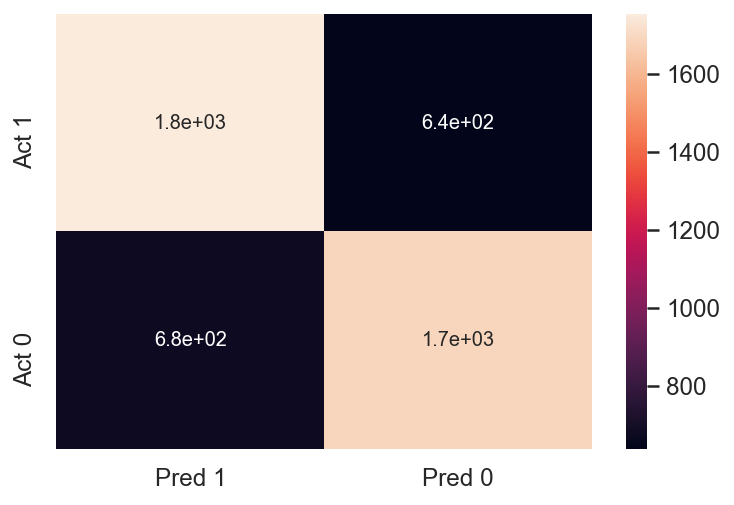

In [731]:
# Logistic Regression Before Tuning
cm = confusion_matrix(y_test, y_pred_5, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

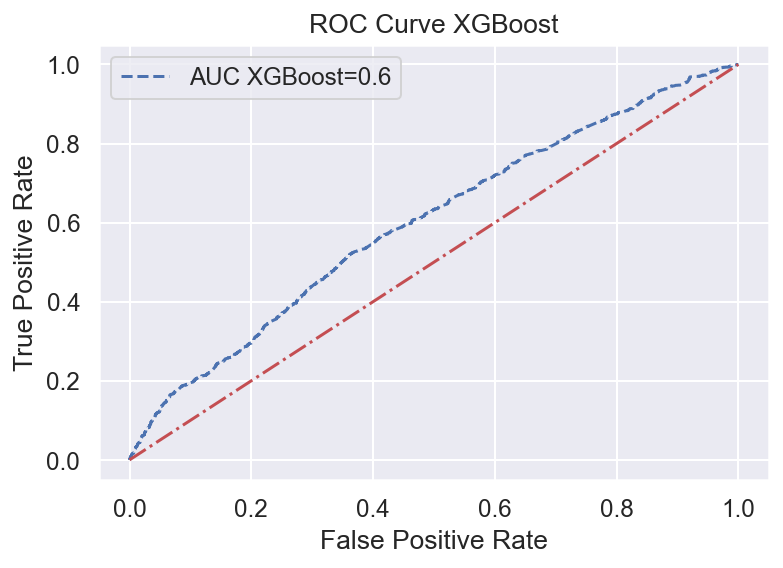

In [732]:
# calculate roc curves
fpr9, tpr9, _ = roc_curve(y_test, test_labels_XGB)
sc8 = round(auc(fpr8, tpr8),2)
# plot the roc curve for the model
plt.plot(fpr8, tpr8, linestyle='--', label=f'AUC XGBoost={sc8}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve XGBoost')
plt.legend();

## 5. a. Hyperparameter Tuning XGBoost

In [733]:
param_xgboost = {
     "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
     "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
     "min_child_weight" : [ 1, 3, 5, 7 ],
     "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
     "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] 
}

In [735]:
model_XGBRSCV = RandomizedSearchCV(estimator = XGBClassifier(), param_distributions = param_xgboost, cv = 5)
model_XGBRSCV.fit(X_train_preprocessed, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100,...
                                           num_parallel_tree=None,
                                           random_state=None, reg_alpha=None,
                                    

In [736]:
model_XGBRSCV.best_params_

{'min_child_weight': 5,
 'max_depth': 15,
 'learning_rate': 0.15,
 'gamma': 0.3,
 'colsample_bytree': 0.7}

In [737]:
model_XGBRSCV.score(X_test_preprocessed, y_test)

0.7837326607818411

In [738]:
# Input the best param as the parameters
model5_tuning = XGBClassifier(min_child_weight=5, max_depth=15, learning_rate= 0.15, gamma= 0.3, colsample_bytree= 0.7)
model5_tuning.fit(X_train_preprocessed, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0.3, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.15, max_delta_step=0, max_depth=15,
              min_child_weight=5, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [739]:
y_pred5_tuning = model5_tuning.predict(X_test_preprocessed)
test_labels_XGB = model5_tuning.predict_proba(X_test_preprocessed)[:,1]

model_5_tuning_metrics = pd.DataFrame(data = [
    accuracy_score(y_test, y_pred5_tuning) * 100, 
    recall_score(y_test, y_pred5_tuning) * 100,
    precision_score(y_test, y_pred5_tuning) * 100, 
    roc_auc_score(y_test, test_labels_XGB) * 100,
    f1_score(y_test, y_pred5_tuning) * 100],
index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
            columns = ['Score XGB Boost with Tuning (%)'])
model_5_tuning_metrics

,Score XGB Boost with Tuning (%)
accuracy,78.373266
recall,82.239866
precision,76.516330
roc_auc_score,86.333598
f1_score,79.274924


In [740]:
model_5_tuning_train_test = pd.DataFrame(data = [model5_tuning.score(X_train_preprocessed, y_train)*100,
                    model5_tuning.score(X_test_preprocessed, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score XGBoost with Tuning (%)']
            )
model_5_tuning_train_test

,Score XGBoost with Tuning (%)
Model Score in Data Train,88.076223
Model Score in Data Test,78.373266


In [741]:
# After Tuning: y_pred3_tuning
print(classification_report(y_test, y_pred5_tuning))

              precision    recall  f1-score   support

           0       0.81      0.74      0.77      2365
           1       0.77      0.82      0.79      2393

    accuracy                           0.78      4758
   macro avg       0.79      0.78      0.78      4758
weighted avg       0.79      0.78      0.78      4758



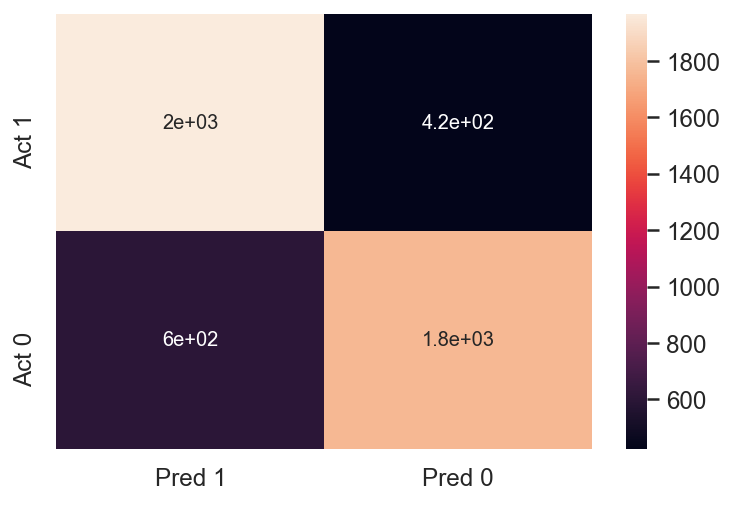

In [742]:
# Logistic Regression After Tuning
cm = confusion_matrix(y_test, y_pred5_tuning, labels=[1, 0])
df = pd.DataFrame(cm, columns=['Pred 1', 'Pred 0'], index=['Act 1', 'Act 0'])
sns.heatmap(df, annot=True);

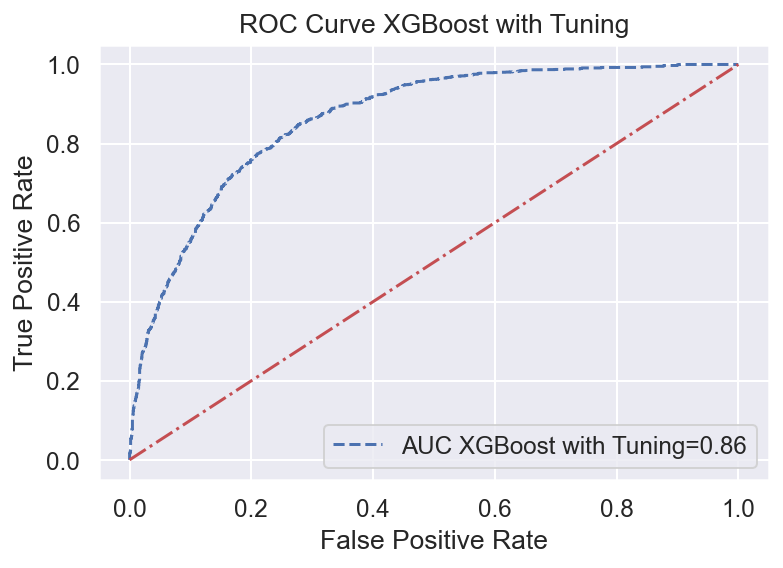

In [743]:
# calculate roc curves
fpr10, tpr10, _ = roc_curve(y_test, test_labels_XGB)
sc10 = round(auc(fpr10, tpr10),2)
# plot the roc curve for the model
plt.plot(fpr10, tpr10, linestyle='--', label=f'AUC XGBoost with Tuning={sc10}')
plt.plot([0,1], [0,1], 'r-.')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.title('ROC Curve XGBoost with Tuning')
plt.legend();

## Conclusions

In [747]:
pd.concat([model_1_metrics, model_1_tuning_metrics, model_2_metrics, model_2_tuning_metrics, model_3_metrics, model_3_tuning_metrics, model_4_metrics, model_4_tuning_metrics,  model_5_metrics, model_5_tuning_metrics], axis=1)

,Score KNearest Neighbors Default(%),Score KNearest Neighbors with Tuning (%),Score Random Forest Classifier Default(%),Score Random Forest Classifier with Tuning (%),Score Logistic Regression Default(%),Score Logistic Regression with Tuning (%),Score Ada Boost Default(%),Score Ada Boost with Tuning (%),Score XGBoost Default(%),Score XGB Boost with Tuning (%)
accuracy,73.623371,74.632198,89.218159,87.431694,50.420345,50.504414,56.830601,57.545187,72.362337,78.373266
recall,86.961972,91.015462,95.027163,90.722942,44.003343,44.755537,50.438780,50.396991,73.297117,82.239866
precision,68.816138,68.706625,85.232384,85.237534,50.820463,50.903042,58.168675,59.146641,72.181070,76.516330
roc_auc_score,81.274710,90.905866,95.916870,94.119468,51.688143,51.740224,59.512337,59.917960,81.503858,86.333598
f1_score,76.832195,78.303074,89.863663,87.894737,47.166853,47.631755,54.028648,54.422383,72.734812,79.274924


In [748]:
pd.concat([model_1_train_test, model_1_tuning_train_test, model_2_train_test, model_2_tuning_train_test, model_3_train_test, model_3_tuning_train_test, model_4_train_test, model_4_train_test,  model_5_train_test, model_5_train_test], axis=1)

,Score KNearest Neighbors Default (%),Score KNearest Neighbors with Tuning (%),Score Random Forest Classifier Default (%),Score Random Forest Classifier with Tuning (%),Score Logistic Regression Default (%),Score Logistic Regression with Tuning (%),Score AdaBoost Default (%),Score AdaBoost Default (%),ScoreXGBoost Default (%),ScoreXGBoost Default (%)
Model Score in Data Train,81.841110,94.612582,94.612582,94.612582,51.800476,51.870534,56.802578,56.802578,78.667507,78.667507
Model Score in Data Test,73.623371,74.632198,89.218159,87.431694,50.420345,50.504414,56.830601,56.830601,72.362337,72.362337


## Export Model

In [749]:
joblib.dump(model_RF, 'Model_RF')

['Model_RF']

## Test Dataset 

In [750]:
test_file = pd.read_csv('test.csv')

In [751]:
test_file.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal
0,JG04,1.256981,PG03,1.256981,0.707107,RM_type_A,1,1988,N,0,level_3,3.08,2009,6,4,2,6,3,7,84.02,0.0
1,JG04,1.224745,PG03,1.224745,1.256981,RM_type_B,2,1991,N,0,level_4,3.31,2014,2,2,2,0,1,0,63.74,0.0
2,JG04,0.500000,PG03,0.500000,1.081665,RM_type_A,2,1989,Y,1,level_4,3.44,2011,4,2,2,0,2,1,88.19,1.0
3,JG04,1.256981,PG03,1.256981,1.802776,RM_type_A,2,1990,Y,1,level_4,0.00,2014,3,1,3,0,3,0,25.94,0.0
4,JG04,1.352775,PG03,1.352775,1.224745,RM_type_B,1,1985,Y,0,level_4,3.34,2007,5,3,2,0,3,0,82.32,0.0


In [752]:
load_model = joblib.load('Model_RF')

In [754]:
prediction = load_model.predict(test_file)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/compose/_column_transformer.py:440: FutureWarning:

Given feature/column names or counts do not match the ones for the data given during fit. This will fail from v0.24.



In [755]:
prediction

array([0, 0, 1, ..., 0, 1, 0])